# "A brains main evolutionary purpose is to predict incoming sensory information"

# To Read:

microcircuitry of forward and feedback connection in visual cortex: https://onlinelibrary.wiley.com/doi/10.1002/%28SICI%291096-9861%2819960506%29368%3A3%3C383%3A%3AAID-CNE5%3E3.0.CO%3B2-1

#### https://onlinelibrary.wiley.com/doi/epdf/10.1002/%28SICI%291096-9861%2819960506%29368%3A3%3C383%3A%3AAID-CNE5%3E3.0.CO%3B2-1?saml_referrer

artificial virtual cortex: https://advanced.onlinelibrary.wiley.com/doi/10.1002/adma.201903095

Preparatory attention in visual cortex https://nyaspubs.onlinelibrary.wiley.com/doi/10.1111/nyas.13320



#### https://nyaspubs.onlinelibrary.wiley.com/doi/epdf/10.1111/nyas.13320

## UNBEDINGT https://www.izhikevich.org/publications/spnet.pdf

https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1000879
http://www.scholarpedia.org/article/Phase_model
http://www.scholarpedia.org/article/State_space
http://www.scholarpedia.org/article/Equilibrium
https://www.izhikevich.org/publications/encwco.pdf
https://www.izhikevich.org/publications/spnet.pdf

https://arxiv.org/pdf/1509.03162#:~:text=,%28Scannell

## Prio: https://pmc.ncbi.nlm.nih.gov/articles/PMC6665918/#:~:text=target%20of%20the%20V1%20projection,layer%20pyramidal%20cells%2C%20had%20a 

 


In [1]:
import nest
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Dict, Any
from IPython.display import Image, display
from numpy import diag, array, zeros 
import random
import numpy as np
import numpy as np, heapq, random


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.8.0
 Built: Jan 27 2025 08:17:55

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [2]:
SCALING_FACTOR = 1.0
k=10.0 # for default
m=np.zeros(3)


## Helper Functions

In [3]:
# Both will be used later

def extract_connections(pre, post):

    conn = nest.GetConnections(pre, post)
    df = pd.DataFrame({
        "pre_gid":  conn.source,
        "post_gid": conn.target,
        "weight":   nest.GetStatus(conn, "weight"),
        "delay":    nest.GetStatus(conn, "delay")
    })
    return df


def to_adjacency(df, pre_ids, post_ids, attr="weight"):
    idx = {gid: i for i, gid in enumerate(pre_ids)}
    jdx = {gid: j for j, gid in enumerate(post_ids)}
    mat = np.zeros((len(pre_ids), len(post_ids)))
    for _, row in df.iterrows():
        i, j = idx[row.pre_gid], jdx[row.post_gid]
        mat[i, j] = row[attr]
    return mat

In [4]:
def plot_point_clusters(
    clusters,
    colors= None,
    marker_size = 20,
    cmap = 'tab10',
    xlabel = 'X',
    ylabel = 'Y',
    zlabel = 'Z',
    title = None,
    edgecolor='k', alpha=0.8,linewidths=1.5
):
    """
    Plots multiple 3D point clouds in distinct colors.

    Args:
        clusters (List[np.ndarray]): 
            List of arrays, each of shape (N_i, 3), containing (x,y,z) points.
        colors (List[str], optional):
            List of colors (matplotlib format) to use for each cluster. 
            If None, a categorical colormap is used.
        marker_size (float, optional):
            Size of scatter markers.
        cmap (str, optional):
            Name of categorical colormap (used if colors is None).
        xlabel, ylabel, zlabel (str, optional):
            Axis labels.
        title (str, optional):
            Plot title.
    """
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    n = len(clusters)
    
    if colors is None:
        cmap_obj = plt.get_cmap(cmap)
        colors = [cmap_obj(i / max(n-1, 1)) for i in range(n)]
    
    for pts, col in zip(clusters, colors):
        pts = np.asarray(pts)
        if pts.size == 0:
            continue
        ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2],
                   c=[col], s=marker_size, edgecolor=edgecolor, alpha=alpha,linewidths=linewidths)
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_zlabel(zlabel)
    if title:
        ax.set_title(title)
    plt.show()
    

def plot_point_clusters_normalized(
        clusters,
        colors=None,
        marker_size=20,
        cmap='tab10',
        xlabel='X', ylabel='Y', zlabel='Z',
        title=None,
        edgecolor='k', alpha=0.8, linewidths=1.5):

    fig = plt.figure()
    ax  = fig.add_subplot(111, projection='3d')

    n = len(clusters)
    if colors is None:
        cmap_obj = plt.get_cmap(cmap)
        colors = [cmap_obj(i / max(n - 1, 1)) for i in range(n)]

    mins = np.full(3,  np.inf)
    maxs = np.full(3, -np.inf)

    for pts, col in zip(clusters, colors):
        pts = np.asarray(pts)
        if pts.size == 0:
            continue
        ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2],
                   c=[col], s=marker_size,
                   edgecolor=edgecolor, alpha=alpha, linewidths=linewidths)

        mins = np.minimum(mins, pts.min(axis=0))
        maxs = np.maximum(maxs, pts.max(axis=0))

    span   = max(maxs - mins)
    centre = (maxs + mins) / 2

    ax.set_xlim(centre[0] - span / 2, centre[0] + span / 2)
    ax.set_ylim(centre[1] - span / 2, centre[1] + span / 2)
    ax.set_zlim(centre[2] - span / 2, centre[2] + span / 2)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_zlabel(zlabel)
    if title:
        ax.set_title(title)

    plt.tight_layout()
    plt.show()


In [5]:
# may be usefull later, I dunno.

def make_div_curl(f1, f2, f3, h = 1e-5):

    def div(x, y, z):
        df1dx = (f1(x + h, y, z) - f1(x - h, y, z)) / (2*h)
        df2dy = (f2(x, y + h, z) - f2(x, y - h, z)) / (2*h)
        df3dz = (f3(x, y, z + h) - f3(x, y, z - h)) / (2*h)
        return df1dx + df2dy + df3dz

    def curl(x, y, z):
        df3dy = (f3(x, y + h, z) - f3(x, y - h, z)) / (2*h)
        df2dz = (f2(x, y, z + h) - f2(x, y, z - h)) / (2*h)
        c1 = df3dy - df2dz

        df1dz = (f1(x, y, z + h) - f1(x, y, z - h)) / (2*h)
        df3dx = (f3(x + h, y, z) - f3(x - h, y, z)) / (2*h)
        c2 = df1dz - df3dx

        df2dx = (f2(x + h, y, z) - f2(x - h, y, z)) / (2*h)
        df1dy = (f1(x, y + h, z) - f1(x, y - h, z)) / (2*h)
        c3 = df2dx - df1dy

        return np.array([c1, c2, c3])

    return div, curl

# Geometric Numpy Functions


### 1.) Create a circle with n points at any position and pointing in any direction

In [6]:
def circle3d(
    n=10, 
    r=1.0, 
    theta=0, 
    phi=0, 
    m=(0,0,0), 
    name="Circle", 
    plot=False
    ):
    """
    Generate points on a rotated and translated 3D circle.

    Args:
        n (int): Number of points to sample along the circle.
        r (float): Radius of the circle.
        theta (float): Rotation angle around the X-axis, in degrees.
        phi (float):   Rotation angle around the Y-axis, in degrees.
        m (tuple):     3-tuple giving the translation offset (x, y, z).
        name (str):    Title for the plot if `plot=True`.
        plot (bool):   If True, displays a 3D plot of the circle.

    Returns:
        np.ndarray: Array of shape (n, 3) containing the (x, y, z) coordinates.
    """

    
    X_angles = np.linspace(0, 2*np.pi, n, endpoint=False)
    x_coords = SCALING_FACTOR * r * np.cos(X_angles)
    y_coords = SCALING_FACTOR * r * np.sin(X_angles)
    z_coords = np.zeros(n)

    theta = np.deg2rad(theta)
    phi   = np.deg2rad(phi)
    Rx = np.array([[1, 0, 0],
                   [0, np.cos(theta), -np.sin(theta)],
                   [0, np.sin(theta),  np.cos(theta)]])
    Ry = np.array([[ np.cos(phi), 0, np.sin(phi)],
                   [0,           1, 0         ],
                   [-np.sin(phi),0, np.cos(phi)]])
    rotM = Ry @ Rx

    pts = np.vstack((x_coords, y_coords, z_coords)).T
    pts = pts @ rotM
    pts = pts + np.array(m)

    if plot:
        fig = plt.figure()
        ax  = fig.add_subplot(111, projection='3d')
        ax.plot(pts[:,0], pts[:,1], pts[:,2], lw=2)
        max_val = np.max(np.abs(pts))
        ax.set_xlim(-max_val*1.2, max_val*1.2)
        ax.set_ylim(-max_val*1.2, max_val*1.2)
        ax.set_zlim(-max_val*1.2, max_val*1.2)
        ax.set_title(name)
        ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
        plt.show()

    return pts

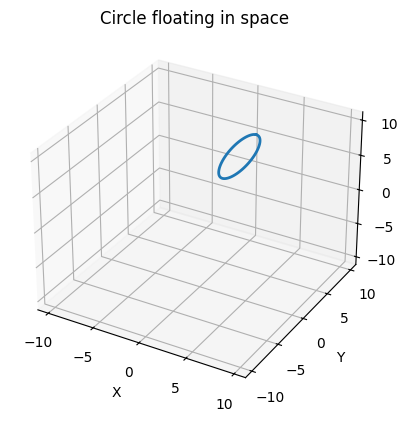

In [7]:
# Example
c = circle3d(
    n=100,
    r=3.0,
    theta=40,
    phi=75,
    m=(2,4,6),
    name="Circle floating in space",
    plot=True)

## 2.) Create a Cone with the same positional and directional freedom.

In [8]:
def create_cone(
    m=np.zeros(3, dtype=np.float32),
    n=1500,
    inner_radius=0.1,
    outer_radius=0.2,
    height=0.6,
    rot_theta=0.0,
    rot_phi=0.0,
    plot=False
    ):
    #~*~*~*~* START *~*~*~*~#
    """
    Generate random points within a truncated cone, apply rotation and translation.

    Args:
        m (np.ndarray): 3-element center offset (x, y, z) of the cone base.
        n (int): Number of points to generate.
        inner_radius (float): Radius of the top (smaller) circle.
        outer_radius (float): Radius of the bottom (larger) circle.
        height (float): Vertical height of the cone.
        rot_theta (float): Rotation angle around the X-axis in degrees.
        rot_phi (float): Rotation angle around the Y-axis in degrees.
        plot (bool): If True, display a 3D scatter plot of generated points.

    Returns:
        np.ndarray: Array of shape (n, 3) containing the (x, y, z) coordinates of points.
    """
    
    #~*~*~*~* END *~*~*~*~#
    

    inner_r = inner_radius * SCALING_FACTOR  
    outer_r = outer_radius * SCALING_FACTOR
    h = height * SCALING_FACTOR
    
    ang = np.random.uniform(0, 2*np.pi, n)
    z = np.random.uniform(m[2], m[2] + h, n)
    
    r = inner_r + (outer_r - inner_r) * ((z - m[2]) / h)
    
    x = m[0] + r * np.cos(ang)
    y = m[1] + r * np.sin(ang)
    
    # randomized on the surface.
    th = np.deg2rad(rot_theta)
    ph = np.deg2rad(rot_phi)
    
    Rx = np.array([[1,         0,          0       ],
                   [0, np.cos(th), -np.sin(th)],
                   [0, np.sin(th),  np.cos(th)]])
    Ry = np.array([[ np.cos(ph), 0, np.sin(ph)],
                   [          0, 1,          0],
                   [-np.sin(ph), 0, np.cos(ph)]])
    rotM = Ry @ Rx
    
    points = np.column_stack((x, y, z))
    points = points @ rotM.T
    
    if plot:
        from mpl_toolkits.mplot3d import Axes3D 
        import matplotlib.pyplot as plt
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(points[:,0], points[:,1], points[:,2], s=2)
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        plt.show()
    
    return points



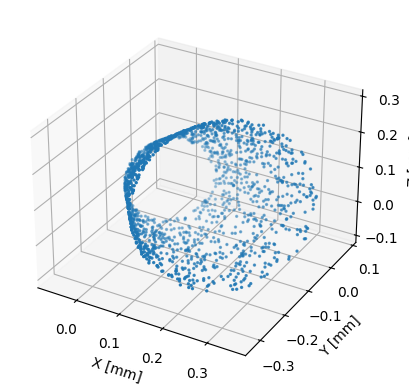

In [9]:
# Demo rotation & displacement
_ = create_cone(rot_theta=33, rot_phi=65, plot=True,inner_radius=0.1,height=0.3)

## 3.) Create a simple Blob with center of mass at m, r radius and n points

In [10]:
def blob_positions(
    n = 10,
    m = np.zeros(3),
    r = 1.0,
    scaling_factor = 1.0,
    plot=False,
    name="Blob"
    ):
        #~*~*~*~* START  *~*~*~*~#

    """
    Generate n random points uniformly distributed inside a sphere.

    Args:
        n (int): Number of points.
        m (np.ndarray): 3-vector specifying the sphere center.
        r (float): Radius of the sphere.
        scaling_factor (float): Global scaling to apply to all coordinates.

    Returns:
        np.ndarray: Array of shape (n,3) with the generated (x,y,z) positions.
    """

    pos_norm = np.random.normal(size=(n, 3))
    pos_norm /= np.linalg.norm(pos_norm, axis=1, keepdims=True)
    
    u = np.random.rand(n, 1)
    r_scaling = r * u**(1/3)
    
    pts = m + pos_norm * r_scaling
    pts *= scaling_factor
    

    if plot:
        fig = plt.figure()
        ax  = fig.add_subplot(111, projection='3d')

        ax.scatter(pts[:,0], pts[:,1], pts[:,2])

        lim = 1.1*np.abs(pts).max()
        ax.set(xlim=(-lim, lim), ylim=(-lim, lim), zlim=(-lim, lim),
               title=name, xlabel='X', ylabel='Y', zlabel='Z')
        plt.show()
    return pts

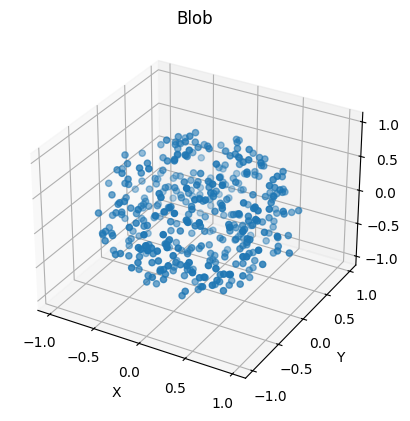

In [11]:
# Example
blob_pos = blob_positions(n=400,plot=True)

## 4.) An array of 2D quadratic grids embedded in 3D space

In [12]:
def set_axes_equal(ax):
        #~*~*~*~* START  *~*~*~*~#

    """
    Adjust a 3D Matplotlib axis so that the X, Y and Z axes are scaled equally.

    This avoids distortion in 3D plots by ensuring that one unit in X, Y, and Z
    appear the same length on screen.

    Args:
        ax (mpl_toolkits.mplot3d.axes3d.Axes3D): The 3D axes to adjust.
    """
        #~*~*~*~* END  *~*~*~*~#

    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()
    x_range = x_limits[1] - x_limits[0]
    y_range = y_limits[1] - y_limits[0]
    z_range = z_limits[1] - z_limits[0]
    max_range = max(x_range, y_range, z_range)
    x_middle = np.mean(x_limits)
    y_middle = np.mean(y_limits)
    z_middle = np.mean(z_limits)
    ax.set_xlim3d(x_middle - max_range/2, x_middle + max_range/2)
    ax.set_ylim3d(y_middle - max_range/2, y_middle + max_range/2)
    ax.set_zlim3d(z_middle - max_range/2, z_middle + max_range/2)

    
    

def create_Grid(m=np.zeros(3, dtype=np.float32),
                grid_size_list=[28, 15, 10],
                rot_theta=0.0, 
                rot_phi=0.0, 
                plot=False):
        #~*~*~*~* START  *~*~*~*~#

    """
    Generate a stack of 2D grid layers in 3D space and optionally plot them.

    Each layer is a k×k grid of points lying in a plane at increasing offsets
    along the first coordinate. The entire stack is then rotated and translated.

    Args:
        m (np.ndarray):       3-vector translation offset applied after rotation.
        grid_size_list (list): List of integers [d1, d2, d3,...], where each
                               entry di defines the grid resolution (di×di)
                               for the layer at depth index i.
        rot_theta (float):    Rotation angle around the X-axis in degrees.
        rot_phi (float):      Rotation angle around the Y-axis in degrees.
        plot (bool):          If True, display a 3D scatter of all layers.

    Returns:
        list of np.ndarray:   A list where each element is an (di*di, 3) array
                              of 3D coordinates for layer i.
    """
        #~*~*~*~* END  *~*~*~*~#

    
    th = np.deg2rad(rot_theta)
    ph = np.deg2rad(rot_phi)
    Rx = np.array([[1, 0, 0],
                   [0, np.cos(th), -np.sin(th)],
                   [0, np.sin(th),  np.cos(th)]])
    Ry = np.array([[ np.cos(ph), 0, np.sin(ph)],
                   [          0, 1,          0],
                   [-np.sin(ph), 0, np.cos(ph)]])
    rotM = Ry @ Rx

    node_layers = []
    for d, k in enumerate(grid_size_list):
        pts = np.array([[d + m[0], w + m[1], n + m[2]]
                        for w in range(k) for n in range(k)])
        node_layers.append(pts @ rotM.T)

    if plot:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        for layer_pts in node_layers:
            ax.scatter(layer_pts[:, 0], layer_pts[:, 1], layer_pts[:, 2], s=1)
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        try:
            ax.set_box_aspect((1,1,1))
        except AttributeError:
            set_axes_equal(ax)
        plt.show()

    return node_layers

def create_Grid_z(m=np.zeros(3, dtype=np.float32),
                grid_size_list=[28, 15, 10],
                rot_theta=0.0, 
                rot_phi=0.0, 
                plot=False):
    
    th = np.deg2rad(rot_theta)
    ph = np.deg2rad(rot_phi)

    Rx = np.array([[1, 0, 0],
                   [0, np.cos(th), -np.sin(th)],
                   [0, np.sin(th),  np.cos(th)]])

    Ry = np.array([[ np.cos(ph), 0, np.sin(ph)],
                   [          0, 1,          0],
                   [-np.sin(ph), 0, np.cos(ph)]])

    rotM = Ry @ Rx

    node_layers = []
    for d, k in enumerate(grid_size_list):
        pts = np.array([[w, n, d] for w in range(k) for n in range(k)])  # jetzt XY-Gitter in Z-Tiefe d
        pts = pts @ rotM.T + m
        node_layers.append(pts)

    if plot:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        for layer_pts in node_layers:
            ax.scatter(layer_pts[:, 0], layer_pts[:, 1], layer_pts[:, 2], s=1)
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        try:
            ax.set_box_aspect((1,1,1))
        except AttributeError:
            set_axes_equal(ax)
        plt.show()

    return node_layers

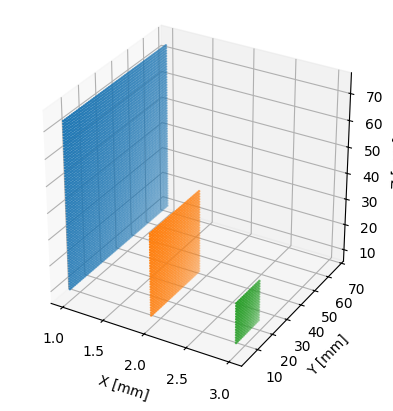

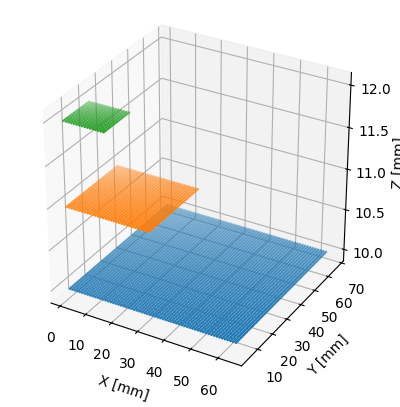

In [13]:
# Example:
grid_size_list = [64,32,16]
a = create_Grid(m=np.array([1,4,10]),grid_size_list=grid_size_list, plot=True, rot_phi=0)#grows in x direction
a = create_Grid_z(m=np.array([1,4,10]),grid_size_list=grid_size_list, plot=True, rot_phi=0)#grows in z direction

## I want to be able to create whole volumina filled with populations of distinct neuron types distributed randomly at different (possible) positions on a grid. They should havingalso having some sort of internal structures which are not so random anymore at the same time. 
## To be clear here: I want to be able to control the structure of SNN's but I also do not want to disturb the random processes which lead to interesting behavior. I need to find a way to satisfy both, building populations with probability distributions and neighboring rules.
## A few years ago I came across some coding challenges and one of the tasks was to create a generative algorithm for procedural maps.
## That's what I'm going to implement here. For simplicity this code will generate will generate a cube (a given size) filled with labels which are defined as a list together with their corresponding probabilities as another list. Important: Positional encoding. x[0] <-> p[0] 
## NOTE: the probabilities MUST add up to 1!

# 5.) Wave Function Collapse For Neuron Labels

In [14]:
# can use a mask.
# better for more uniformly sized clusters. here even low prob. types form clusters approx this size. 
# they stay just rare according to their prob. or so I strongly assume. because of the nature of this algorithm.
# this holds for < (space_dim**space_dim - 1 - log(base=space_dim,x=( space_dim**space_dim))) = 23 types (in 3D) 
# this pattern should break because the clusters form from the pigion hole principle. or so I imagine
def wave_collapse_old(mask=None, 
                  dims=(2,2,2), 
                  sparse_holes = 0,
                  type_array=[0,1],
                  probability_vector=np.array([0.3,0.7]), 
                  start_pos=np.zeros(3),
                  sparsity_factor=0.7,
                seed=42):
    
    """
    Perform a 3D "wave function collapse" to assign discrete labels to grid cells, 
    forming clusters based on local entropy and neighbor constraints.

    Parameters:
        mask (np.ndarray or None): Initial occupancy mask of shape dims. 
            0 = uncollapsed, -1 = blocked. If None, a zero mask is created.
        dims (tuple[int]): Grid dimensions if mask is None.
        sparse_holes (int): Number of random positions to block (-1) for holes.
        type_array (list[int]): List of possible labels.
        probability_vector (np.ndarray): Initial probability for each label.
        start_pos (array-like): Starting coordinate to seed collapse.
        sparsity_factor (float): Controls influence of existing neighbor labels.
        seed (int): Base seed for random number generators.

    Returns:
        np.ndarray: Array of shape dims with assigned labels for each cell.
    """
    
    
    
    # Initialize random seeds for reproducibility
    random.seed(seed+3)
    np.random.seed(seed+7)

    # Normalize probability vector
    probability_vector = np.asarray(probability_vector, dtype=float)
    probability_vector /= probability_vector.sum()
    
    # Create mask if not provided: 0=uncollapsed, -1=blocked
    if mask is None:
        mask = np.zeros(dims, dtype=np.int32)
    dims=mask.shape
    
    # High initial entropy for all cells
    entropy_matrix = np.full(shape=dims, fill_value=1000.0, dtype=np.float32)
    
    # Store collapsed labels; -1 indicates not yet collapsed
    collapsed_nodes = np.full(shape=dims, fill_value=-1, dtype=np.int32)
    
    
    D0, D1, D2 = mask.shape
    
    
    # Randomly block positions to create holes if desired
    if(sparse_holes!=0):
        for _ in range(0,sparse_holes,1):
            x = random.randint(0,D0-1)
            y = random.randint(0,D1-1)
            z = random.randint(0,D2-1)
            mask[x][y][z] = -1
        
    def check_neighbors(i, j, k):
        undef_neighbors = []
        def_neighbors = []
        """
        Return lists of uncollapsed and collapsed neighbor coordinates in all directions.
        """ 
        shifts = [(dx, dy, dz)         # Examine all 26 neighbors in 3D
              for dx in (-1, 0, 1) 
              for dy in (-1, 0, 1) 
              for dz in (-1, 0, 1) 
              if not (dx == dy == dz == 0)]        
        for di, dj, dk in shifts:
            ni, nj, nk = i+di, j+dj, k+dk
            if 0 <= ni < D0 and 0 <= nj < D1 and 0 <= nk < D2:
                if mask[ni, nj, nk] == 0:
                    undef_neighbors.append((ni, nj, nk))
                elif mask[ni, nj, nk] == 1:
                    def_neighbors.append((ni, nj, nk))
                else:
                    continue  # ignore blocked cells

                    
        return undef_neighbors, def_neighbors
    

    def entropy(p, base=None):
        """Compute Shannon entropy of probability vector p."""
        p = np.asarray(p, dtype=float)
        p += 0.0001
        p/=np.sum(p)# p > 0
        log_p = np.log(p) if base is None else np.log(p) / np.log(base)
        return -np.sum(p * log_p)
    
    def collapse(i, j, k):        
        """
        Collapse the cell at (i,j,k) by sampling a label based on local probabilities and neighbor influence.
        """
        if(mask[i][j][k]):#if already collapsed
            pass #TODO for invariants
        
        # Copy and adjust probabilities based on collapsed neighbors

        
        l = len(probability_vector)
        l1 = int((1-sparsity_factor)*l) 
        # Boost probability for each neighbor label

        list_of_uncollapsed_neighbors, list_of_collapsed_neighbors = check_neighbors(i,j,k)
        
        neighbor_labels = []
        for x,y,z in list_of_collapsed_neighbors:
            neighbor_labels.append(collapsed_nodes[x][y][z])
        
        #possible_values = np.setdiff1d(type_array,neighbor_labels) #regel zu hart für Klusterbildung
        
        private_probability_vector = probability_vector.copy()
        
        for m in neighbor_labels:# label gleichzeitig index für probability vektor
            # private_probability_vector anpassen
            p = private_probability_vector[m] / (l + l1)
            p_self = l1 * p
            p_rest = p
            p_redistribution = np.full(shape=(l,),fill_value=p_rest)
            p_redistribution[m] += p_self
            private_probability_vector[m] = 0.0 #setze wert im original zurück
            private_probability_vector+=p_redistribution
        private_probability_vector/=private_probability_vector.sum()#danach um sequenziellen Einfluss zu minimieren
        #print("#######",np.sum(private_probability_vector))#just a check
        choice = np.random.choice(type_array,p=private_probability_vector)#damit kein ablaufmuster entsteht
        collapsed_nodes[i][j][k] = choice
        mask[i][j][k]=1
        entropy_matrix[i][j][k] = 0.0
        # Update entropy for uncollapsed neighbors

        #after collapsed
        # Anpassung der Entropie der Nachbarn

        for ni, nj, nk in list_of_uncollapsed_neighbors:
            _, coll_nbrs = check_neighbors(ni, nj, nk)
            neigh_labels = [collapsed_nodes[x,y,z] for x,y,z in coll_nbrs]

            allowed = np.setdiff1d(type_array, neigh_labels)

            p = np.zeros_like(probability_vector, dtype=float)
            idxs = [type_array.index(a) for a in allowed]
            p[idxs] = probability_vector[idxs]
            if p.sum() > 0:
                p /= p.sum()
            else:
                p[:] = 1 / len(p)
            entropy_matrix[ni, nj, nk] = entropy(p, base=2)
        
            
    def _next():
        """Select the next uncollapsed cell with minimal non-zero entropy."""
        candidates = np.argwhere(mask == 0)
        if candidates.size == 0:
            return None
        valid = [(tuple(idx), entropy_matrix[tuple(idx)]) 
                 for idx in candidates 
                 if entropy_matrix[tuple(idx)] > 0]
        if not valid:
            return None
        next_idx = min(valid, key=lambda x: x[1])[0]
        return next_idx
    
    # Main collapse loop
    while True:
        nxt = _next()
        if nxt is None:
            break
        collapse(*nxt)

    return np.array(collapsed_nodes)#, entropy_matrix


# newer version, much faster on big clusters but doesnt use entropy to determine the next cell to collapse.
# chooses randomly instead.
# für minikolonne mit >80–100 Neuronen und makrokolonne mit 4000–12000 Neuronen



def wave_collapse(dims, type_array, probability_vector,
                       sparsity_factor=.7, seed=0, sparse_holes=0):
    NEIGHBOR_OFFSETS = np.array([(dx,dy,dz)
      for dx in (-1,0,1) for dy in (-1,0,1) for dz in (-1,0,1)
      if (dx,dy,dz)!=(0,0,0)], dtype=np.int8)
    random.seed(seed+3); np.random.seed(seed+7)
    probability_vector = np.asarray(probability_vector, float); probability_vector /= probability_vector.sum()
    mask  = np.zeros(dims, np.int8)
    if sparse_holes:                       
        idx = np.random.choice(mask.size, sparse_holes, replace=False)
        mask.ravel()[idx] = -1

    collapsed = -np.ones(dims, np.int16)
    H = np.full(dims, 999., np.float32)

    heap = [(H[i,j,k],i,j,k) for i in range(dims[0])
                               for j in range(dims[1])
                               for k in range(dims[2]) if mask[i,j,k]==0]
    heapq.heapify(heap)

    while heap:
        h,i,j,k = heapq.heappop(heap)
        if mask[i,j,k]:                    
            continue

        neigh = NEIGHBOR_OFFSETS + (i,j,k)
        good  = ((neigh[:,0] >= 0) & (neigh[:,0] < dims[0]) &
                 (neigh[:,1] >= 0) & (neigh[:,1] < dims[1]) &
                 (neigh[:,2] >= 0) & (neigh[:,2] < dims[2]))
        neigh = neigh[good]
        labels = collapsed[tuple(neigh.T)]
        labels = labels[labels >= 0]              

        if labels.size:
            counts = np.bincount(labels, minlength=len(type_array))
            boost  = counts * (1-sparsity_factor)/len(type_array)
            p = probability_vector + boost
            p /= p.sum()
        else:
            p = probability_vector

        choice = np.random.choice(type_array, p=p)
        collapsed[i,j,k] = choice
        mask[i,j,k] = 1
        H[i,j,k] = 0.0

        for ni,nj,nk in neigh:
            if mask[ni,nj,nk]==0:
                H[ni,nj,nk] = 1.0  
                heapq.heappush(heap,(H[ni,nj,nk],ni,nj,nk))

    return collapsed




In [15]:
# Example 1: Binary

old1 = wave_collapse_old(dims=(5,5,5),sparse_holes=0,sparsity_factor=0.9,probability_vector=[0.5,0.5], type_array=[0,1])
new1 = wave_collapse(dims=(5,5,5),sparse_holes=0,sparsity_factor=0.9,probability_vector=[0.5,0.5], type_array=[0,1])

    
    
# Runtime is of the old algorithm is roughly quadratic–cubic, but it’s intended to create patches for micro-clusters.
# A grid of size 10×20×20 already corresponds to about 4K neurons.
# sure it takes time, but if you want to have "random structures of higher quality" - whatever that means -
# then you should create miniclusters with old wfc and maybe patch them together. because the runtime here
# is horrible.


# Each natural number in the grid will eventually serve as a class label for neurons.
# That mapping will be implemented in the corresponding function.

# -1 indicates a blocked cell where no neuron can be placed.
#  0 indicates an available cell that could hold a neuron but hasn’t been assigned yet.
#    (You could choose to assign a neuron to 0 if desired.)
# This scheme reserves space in the grid for later hypothetical neurogeneration,
# ensuring that these slots persist under any transformations.

# Next step: transform the grid and then convert each label into actual neuron placements.

# You can clearly see how “channels” of like-typed neurons emerge.
# It works exactly as intended!


old1,new1

(array([[[0, 0, 1, 1, 0],
         [1, 0, 0, 1, 0],
         [0, 1, 1, 0, 1],
         [0, 1, 0, 0, 1],
         [1, 0, 0, 1, 1]],
 
        [[0, 0, 0, 1, 1],
         [0, 1, 0, 1, 1],
         [1, 0, 0, 0, 1],
         [1, 1, 1, 1, 0],
         [1, 0, 1, 1, 0]],
 
        [[0, 1, 0, 1, 1],
         [1, 1, 0, 1, 0],
         [0, 1, 0, 1, 0],
         [1, 0, 1, 1, 0],
         [1, 0, 1, 0, 1]],
 
        [[0, 1, 0, 1, 0],
         [1, 1, 0, 0, 0],
         [1, 1, 0, 0, 1],
         [1, 1, 1, 1, 0],
         [1, 1, 0, 0, 0]],
 
        [[1, 1, 0, 0, 1],
         [1, 0, 1, 1, 1],
         [1, 0, 0, 0, 0],
         [1, 0, 1, 0, 1],
         [1, 0, 1, 1, 0]]], dtype=int32),
 array([[[0, 1, 0, 1, 1],
         [1, 1, 0, 0, 1],
         [1, 1, 0, 0, 0],
         [1, 0, 0, 1, 0],
         [1, 1, 0, 1, 1]],
 
        [[0, 1, 1, 1, 1],
         [0, 1, 0, 0, 0],
         [1, 1, 0, 0, 0],
         [1, 0, 1, 0, 0],
         [1, 0, 1, 0, 1]],
 
        [[0, 0, 1, 1, 0],
         [0, 0, 1, 1, 1],
    

In [16]:
# Example 2: Multible labels.
old2 = wave_collapse_old(dims=(5,5,5),sparse_holes=9,sparsity_factor=0.42,probability_vector=[0.1,0.2,0.2,0.1,0.1,0.2,0.1], type_array=[0,1,2,3,4,5,6])
new2 = wave_collapse(dims=(5,5,5),sparse_holes=9,sparsity_factor=0.42,probability_vector=[0.1,0.2,0.2,0.1,0.1,0.2,0.1], type_array=[0,1,2,3,4,5,6])
old2, new2

(array([[[ 2,  1,  5,  2,  5],
         [ 6,  5,  6,  5,  5],
         [ 5,  1,  6,  5,  4],
         [ 5,  2,  6,  2,  4],
         [-1,  3,  6,  4,  2]],
 
        [[ 4,  3,  4,  1,  4],
         [ 2,  0,  2,  1,  0],
         [ 0, -1,  2,  6,  2],
         [-1,  4,  1,  5,  1],
         [ 6,  2,  1,  5,  5]],
 
        [[-1,  6, -1,  6,  2],
         [ 2,  3,  0,  5,  0],
         [ 1,  5,  4,  6,  5],
         [ 4,  0,  5, -1,  6],
         [ 1,  3,  6,  4,  4]],
 
        [[-1,  4,  5,  4,  1],
         [ 4,  3,  1,  0,  2],
         [ 1,  2,  1,  3,  4],
         [ 0,  5,  0,  2,  1],
         [ 1,  5,  1,  3,  4]],
 
        [[ 1,  2,  6,  4,  2],
         [ 3,  6,  4,  0,  5],
         [ 4,  5,  0,  6,  3],
         [ 4, -1,  4,  6,  0],
         [ 3,  6,  2,  4,  2]]], dtype=int32),
 array([[[ 2,  5,  6,  1,  2],
         [-1,  6,  3,  1,  5],
         [ 3,  1,  6,  1,  1],
         [ 2,  2,  1,  1,  1],
         [ 5,  5, -1,  3,  2]],
 
        [[ 3,  3,  6,  5,  0],
        

## To make this work now we need a Qube of the same dimensions. We create a bijection.
## 6.) Create a Qube and morph it. Each point has the same distance at the start.

In [17]:
def generate_qube(grid_size_list=(10, 10, 10)):
    """
    Generate a 3D grid of points within a cube from -1 to 1 in each axis.

    Args:
        grid_size_list (tuple of int): Number of samples along each axis (nx, ny, nz).

    Returns:
        np.ndarray: An array of shape (nx*ny*nz, 3) containing the (x, y, z) coordinates.
    """
    nx, ny, nz = grid_size_list
    xs = np.linspace(-1, 1, nx)
    ys = np.linspace(-1, 1, ny)
    zs = np.linspace(-1, 1, nz)
    X, Y, Z = np.meshgrid(xs, ys, zs, indexing='ij')
    return np.vstack((X.ravel(), Y.ravel(), Z.ravel())).T 


In [18]:
def transform_points(
    points,
    m = np.zeros(3, dtype=float),
    rot_theta = 0.0,
    rot_phi = 0.0,
    transform_matrix = np.eye(3),
    plot = False
    ):
    """
    Apply rotation, linear transformation, and translation to a set of 3D points.

    Args:
        points (np.ndarray): Array of shape (N,3) containing the original points.
        m (np.ndarray):      Translation offset as a 3-vector.
        rot_theta (float):   Rotation angle around the X-axis in degrees.
        rot_phi (float):     Rotation angle around the Y-axis in degrees.
        transform_matrix (np.ndarray): 3×3 matrix to apply after rotation.
        plot (bool):         If True, display a 3D scatter of the transformed points.

    Returns:
        np.ndarray: Array of shape (N,3) with transformed coordinates.
    """
    pts = np.asarray(points, dtype=float)
    
    th = np.deg2rad(rot_theta)
    ph = np.deg2rad(rot_phi)
    Rx = np.array([[1,          0,           0],
                   [0, np.cos(th), -np.sin(th)],
                   [0, np.sin(th),  np.cos(th)]])
    Ry = np.array([[ np.cos(ph), 0, np.sin(ph)],
                   [          0, 1,          0],
                   [-np.sin(ph), 0, np.cos(ph)]])
    rotM = Ry @ Rx
    
    rotated = (rotM @ pts.T).T
            
    transformed = (transform_matrix @ rotated.T).T
    
    result = transformed + np.asarray(m, dtype=float)
    
    if plot:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(result[:,0], result[:,1], result[:,2], s=2)
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        plt.show()
    
    return result

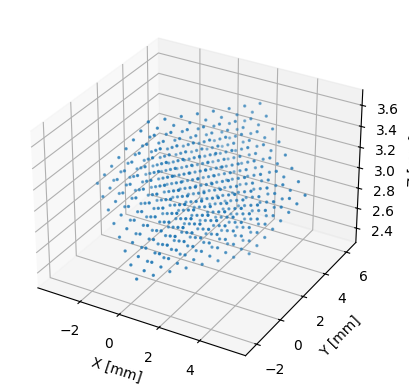

Anz. Punkte:	 512


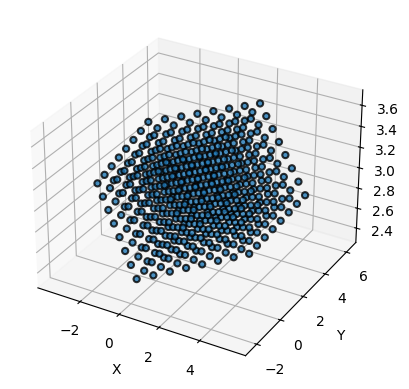

In [19]:
grid = generate_qube((8, 8, 8))


stretch_x, stretch_y, stretch_z = [2.7,3.14,0.42]


pts = transform_points(
        grid,
        m=[1, 2, 3],
        rot_theta=120,
        rot_phi=120,
        transform_matrix=np.diag([stretch_x, stretch_y, stretch_z ]),
        plot=True
    )
    
print("Anz. Punkte:\t",pts.shape[0])
plot_point_clusters([pts])#definitiv besser für highlighting. Hätte die Fkt früher schreiben sollen.

# Move that body! 

## I think it's more a fluid simulation. You need 3 functions to describe that field. Each one corresponds to a "force" that pulls at every point in different directions based on its location. 

## The basic idea is here to morph these structures into something more resembling biological ones. Because then you could create significant connection rules which take distance and their neighbors more into account.

## 7.) Vector Field to be able to move populations of neurons in a controlled way. 

In [20]:
def field(
        positions: np.ndarray,
        f1 = lambda x, y, z: np.zeros_like(x),
        f2 = lambda x, y, z: np.zeros_like(x),
        f3 = lambda x, y, z: np.zeros_like(x),
        plot=False,    
        normalize = False,
        color_by_length = False,
        cmap = 'viridis',
        arrow_length = 0.1
    ):
    """
    Compute a 3D vector field at given positions and optionally visualize it.

    Args:
        positions (np.ndarray): An (N,3) array of (x,y,z) coordinates.
        f1, f2, f3 (callable):  Functions f1(x,y,z), f2(x,y,z), f3(x,y,z) defining
                                the three vector components at each point.
        plot (bool):           If True, display a 3D quiver plot of the field.
        normalize (bool):      If True, normalize each vector to unit length before plotting.
        color_by_length (bool): If True, color arrows by their original lengths.
        cmap (str):             Name of the Matplotlib colormap to use when coloring.
        arrow_length (float):   Scaling factor for arrow lengths in the plot.

    Returns:
        np.ndarray: An (N,3) array of the computed vectors [v1, v2, v3].
    """
    
    x = positions[:, 0]
    y = positions[:, 1]
    z = positions[:, 2]

    v1 = f1(x, y, z)
    v2 = f2(x, y, z)
    v3 = f3(x, y, z)
    vectors = np.column_stack((v1, v2, v3))
    if plot:
        lengths = np.linalg.norm(vectors, axis=1)
        U, V, W = v1.copy(), v2.copy(), v3.copy()
        if normalize:
            nonzero = lengths > 0
            U[nonzero] /= lengths[nonzero]
            V[nonzero] /= lengths[nonzero]
            W[nonzero] /= lengths[nonzero]
            U *= arrow_length
            V *= arrow_length
            W *= arrow_length
        else:
            U *= arrow_length
            V *= arrow_length
            W *= arrow_length

        color_args = {}
        if color_by_length:
            normed = (lengths - lengths.min()) / (lengths.ptp() if lengths.ptp()>0 else 1)
            cmap_obj = plt.get_cmap(cmap)
            colors = cmap_obj(normed)
            color_args['color'] = colors

        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.quiver(
            x, y, z,
            U, V, W,
            **color_args,
            length=1.0,
            normalize=False
        )
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        plt.show()
    return vectors

# This is already a derivative; the next derivative would represent acceleration.
# Perhaps negative acceleration as deviation from the mean could help create suitable attractors.
# meh, nah. 
# Remember: t * d/dx
# and d/dx can be approximated as (f(x+h) - f(x)) / h for each point. I could use this one deriv. step later too.



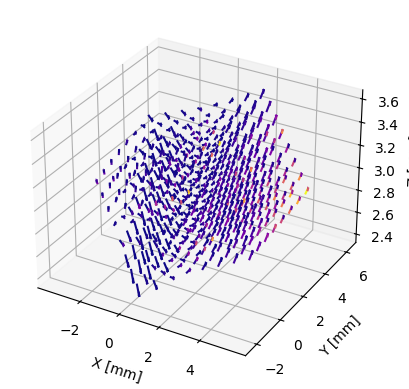

In [21]:
# Example. Look how gorgeous this is.
vector_field = field(positions=pts,    
            plot=True,
            normalize=True,
            color_by_length=True,
            cmap='plasma',
            arrow_length=0.2,
            f1 = lambda x, y, z: 1.5*x**2 + y + z,
            f2 = lambda x, y, z: 1.3*x**3 - y + z,
            f3 = lambda x, y, z: 1.7*x**2 + y - z
)

# 8.) Torus. Just because. Maybe it'll become useful later.

In [22]:
def generate_torus(
        R = 1.0,
        r = 0.3,
        grid_size_list = (100, 40),
    rot_theta=0,
    rot_phi=0,
    plot=False
    ):
    """
    Generate a set of 3-D points on the surface of a torus.

    The torus lies in the XY-plane, centred at the origin.  The major
    radius R is the distance from the origin to the centre of the tube,
    the minor radius r is the tube radius.

    Args:
        R (float):            Major radius (distance from origin to tube centre).
        r (float):            Minor radius (tube radius).
        grid_size_list (tuple of int):
                              Number of samples along the two angular
                              coordinates (n_theta, n_phi).  Higher numbers
                              produce a denser point cloud.

    Returns:
        np.ndarray: Array of shape (n_theta * n_phi, 3) with (x, y, z)
                    coordinates on the torus surface.
    """
    n_theta, n_phi = grid_size_list

    
    theta = np.linspace(0.0, 2.0 * np.pi, n_theta, endpoint=False)  
    phi   = np.linspace(0.0, 2.0 * np.pi, n_phi,   endpoint=False)  

    a, b = np.meshgrid(theta, phi, indexing='ij')  

    x = (R + r * np.cos(b)) * np.cos(a)
    y = (R + r * np.cos(b)) * np.sin(a)
    z =  r * np.sin(b)

    return transform_points(np.vstack((x.ravel(), y.ravel(), z.ravel())).T,
                            rot_theta=rot_theta, rot_phi=rot_phi, plot=plot)

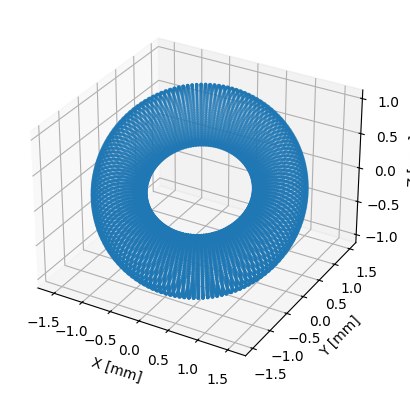

In [23]:
#looks stupid, but each ring could become a ccw. 
#if you want randomness then you can make a simple normal distr on phi, theta.
pts = generate_torus(R=1.2, r=0.4, grid_size_list=(140, 80), rot_theta=25, rot_phi=15, plot=True)


## 9.) Let's make use of the Vector Field

In [24]:
def field_flow_iteration(
                        position=np.zeros(3),
                        f1 = lambda x, y, z: np.zeros_like(x),
                        f2 = lambda x, y, z: np.zeros_like(x),
                        f3 = lambda x, y, z: np.zeros_like(x)):
    """
    Compute a single time-step update of positions moving in a vector field.

    Args:
        positions (np.ndarray): Array of shape (N,3) with current positions.
        dt (float):            Time step size.
        f1, f2, f3 (callable): Functions defining the vector field components.

    Returns:
        np.ndarray: Updated positions after dt using Euler integration.
    """
    velocity = field(
        positions=positions,
        plot=False,
        f1=f1,
        f2=f2,
        f3=f3
    )
    return positions + dt * velocity


def simulate_vector_field_flow(
            initial_positions = np.zeros((3,3)),
            dt = 0.001,
            f1 = lambda x, y, z: np.zeros_like(x),
            f2 = lambda x, y, z: np.zeros_like(x),
            f3 = lambda x, y, z: np.zeros_like(x),
            num_steps = 1,
            plot= True,
            scatter_size = 1.0,
            create_object = False #2 Modi, False liefert lediglich die letzte Position, also Endergebnis
                                  # True liefert Liste aller Zwischenschritte
            ):
    """
    Simulate the flow of points through a 3D vector field over multiple time steps.

    Args:
        initial_positions (np.ndarray): Starting positions, shape (N,3).
        dt (float):                    Time step size for Euler integration.
        f1, f2, f3 (callable):         Functions defining the vector field components.
        num_steps (int):               Number of integration steps.
        plot (bool):                   If True, display scatter plots at each step.
        scatter_size (float):          Size of points in the scatter plot.
        create_object (bool):          If True, return a list of all intermediate
                                       position arrays; otherwise return only final positions.

    Returns:
        np.ndarray or List[np.ndarray]:
            Final positions array if create_object=False, otherwise a list of
            position arrays at each time step.
    """
    
    positions = initial_positions.copy()
    snapshots = []
    
    if(create_object):
        snapshots.append(positions)
    if plot:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

    
    for _ in range(num_steps):
        if plot:
            ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], s=scatter_size)
        velocity = field(positions, f1=f1, f2=f2, f3=f3, plot=False)
        positions = positions + dt * velocity
        if(create_object):
            snapshots.append(positions)

    if plot:
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        plt.show()
    if(create_object):
        return snapshots
    return positions


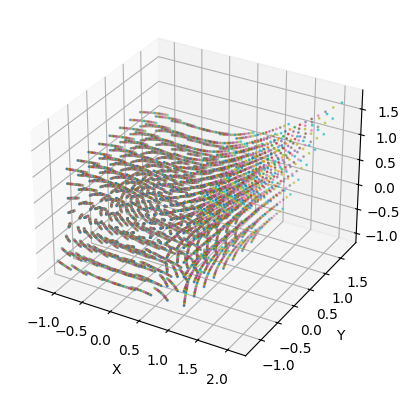

(512, 3)


In [25]:
# Example 1
pts = generate_qube((8, 8, 8))
dt = 0.01
f1 = lambda x, y, z: 1.5*x**2 + y + z
f2 = lambda x, y, z: 1.3*x**3 - y + z
f3 = lambda x, y, z: 1.7*x**2 + y - z

final_positions = simulate_vector_field_flow(
    initial_positions=pts,
    dt=dt,
    f1=f1,
    f2=f2,
    f3=f3,
    num_steps=20,
    plot=True,
    scatter_size=1.0
)
print(final_positions.shape)

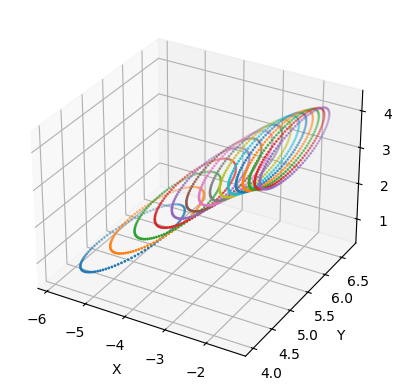

16 snapshots on  100 points with 3  dimensions. Ja, nice!	


In [26]:
# Example 2: You can take snapshots to create complex geometrical shapes out of simple ones
# IF you have the right equations

f1 = lambda x, y, z: 1.5*x**2 + y + z

c = circle3d(100,r=1.0,theta=0,phi=25,m=(-5,5,1),plot=False)
c=np.asarray(c)
final_positions = simulate_vector_field_flow(
    initial_positions=c,
    dt=dt,
    f1=f1,
    f2= lambda x, y, z: x**2 - y,
    f3=f3,
    num_steps=15,
    plot=True,
    scatter_size=1.0,create_object=True
)
print(f'{np.array(final_positions).shape[0]} snapshots on',
      f' {np.array(final_positions).shape[1]} points with {np.array(final_positions).shape[2]}',
      f' dimensions. Ja, nice!\t' )

## 10.) Add local attractor

In [27]:
def add_local_attractor(
    m = np.zeros(3),
    k = 15.0,      # Sog-Stärke
    sigma = 0.9,   # Gauß-Breite
    f1 = lambda x, y, z: np.zeros_like(x),
    f2 = lambda x, y, z: np.zeros_like(x),
    f3 = lambda x, y, z: np.zeros_like(x),
    repulsive=False
):
    """
    Adds a local attractor parametrized by the values above. returns a modified version of the original function.
    The influence of attractors decays exponentially with distance. Like this spherical one.
    """
    x0, y0, z0 = m
    s = 1.0 if repulsive else -1.0

    def w(r):
        return s*np.exp(-0.5*(r/sigma)**2)

    def f1_mod(x, y, z):
        dx = x - x0
        r = np.sqrt(dx*dx + (y-y0)**2 + (z-z0)**2)
        sink = -k * s * w(r) * dx
        return f1(x, y, z) + sink

    def f2_mod(x, y, z):
        dy = y - y0
        r = np.sqrt((x-x0)**2 + dy*dy + (z-z0)**2)
        sink = -k * s * w(r) * dy
        return f2(x, y, z) + sink

    def f3_mod(x, y, z):
        dz = z - z0
        r = np.sqrt((x-x0)**2 + (y-y0)**2 + dz*dz)
        sink = -k * s * w(r) * dz
        return f3(x, y, z) + sink

    return f1_mod, f2_mod, f3_mod


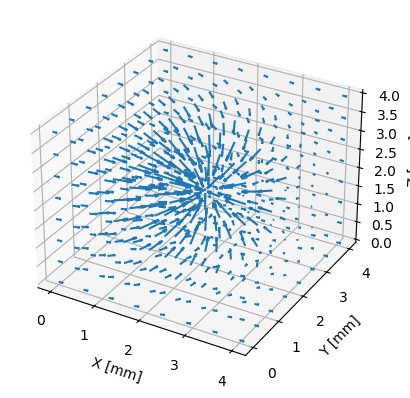

In [28]:
# Example. Added local Attractor at 2,2,2 . The intensity and the direction depends on the paramters
f1_base = lambda x,y,z: 1.0
f2_base = lambda x,y,z: 0.0
f3_base = lambda x,y,z: 0.0

f1_mod, f2_mod, f3_mod = add_local_attractor(
    m=np.array([2.0,2.0,2.0]),
    k=10.0,
    sigma=0.9,
    f1=f1_base,
    f2=f2_base,
    f3=f3_base,
    repulsive=False
)


grid = np.vstack(np.meshgrid(
    np.linspace(0,4,8),
    np.linspace(0,4,8),
    np.linspace(0,4,8),
    indexing='ij'
)).reshape(3,-1).T
l_attr_1 = field(grid, f1_mod, f2_mod, f3_mod, plot=True)

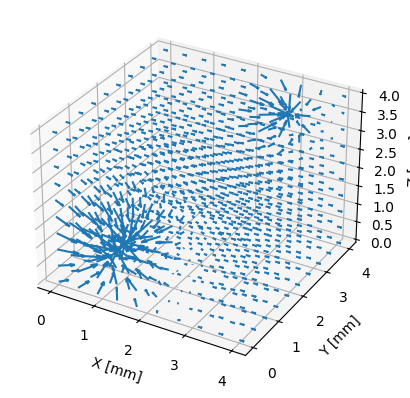

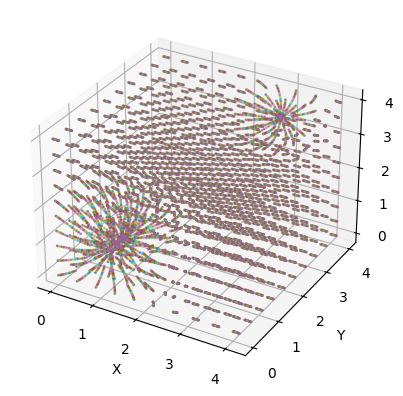

In [29]:
# Example 2 : Add 3 Attractors, 2 of them nearby
f1, f2, f3 = (
    lambda x, y, z: 1.0,
    lambda x, y, z: np.zeros_like(x),
    lambda x, y, z: np.zeros_like(x),
)

attractors = [
    (np.array([1.0, 1.0, 1.0]), 15.0, 0.5),
    (np.array([1.0, 0.0, 1.0]), 10.0, 0.7),
    (np.array([3.0, 3.5, 3.5]), 20.0, 0.4)
]

for m, k, sigma in attractors:
    f1, f2, f3 = add_local_attractor(
        m=m, k=k, sigma=sigma,
        f1=f1, f2=f2, f3=f3,
        repulsive=False
    )

xs = np.linspace(0, 4, 10)
ys = np.linspace(0, 4, 10)
zs = np.linspace(0, 4, 10)
grid = np.vstack(np.meshgrid(xs, ys, zs, indexing='ij')).reshape(3, -1).T  # (12^3, 3)

new_field = field(grid, f1, f2, f3, plot=True)


final_positions = simulate_vector_field_flow(
    initial_positions=grid,
    dt=dt,
    f1=f1,
    f2=f2,
    f3=f3,
    num_steps=15,
    plot=True,
    scatter_size=1.0,create_object=True
)

plt.show()

# WHY ARE WE DOING THIS?
### At this moment I want to make clear that my inspiration for going back to these basics and playing around with silly geometric structures and transformations is because I looked up the fascinating development of the brain from the first incoming neural cells of the foetus to the fully developed human being.
# NEURONS ARE MOVING DURING DEVELOPMENT.
## They are even moving right now. There are different mechanisms. From the theory of Assembloids to observed chemical trace walking, docking, and so on.
## This is the most important phase of neural development and ultimately defines the structure of the brain.
## I want my neuron models to have the same ability. I want to be able to move them. Without limitation. I want to be able to move whole populations in their own direction. In their own way. Completely adjustable. Like the hopes and dreams you have before they are shattered by taxes.

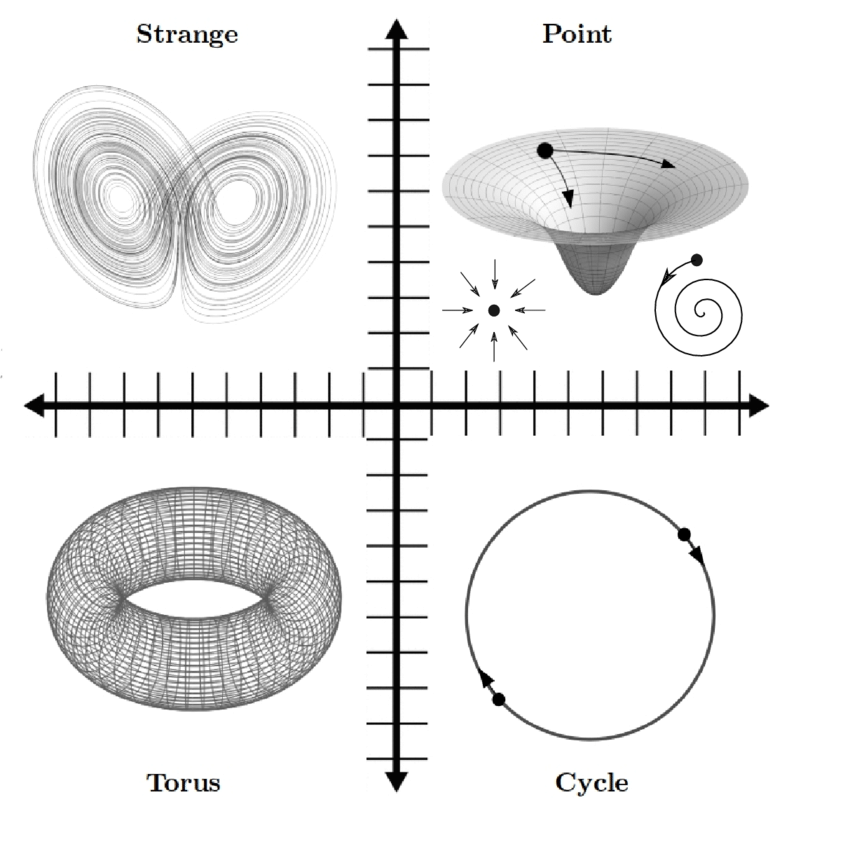

In [30]:
# I want to point out that attractors play a huge role here. 
display(Image(filename='attractors.png.png'))#haha 2/4 are found here

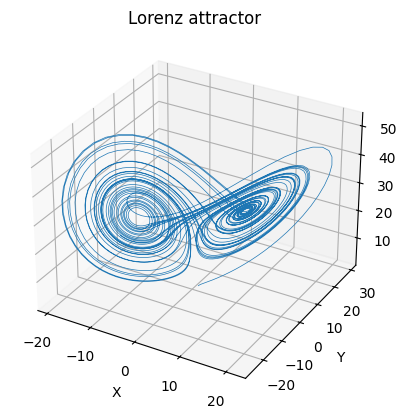

In [31]:
# 3/4. If you turn the Rings in the Torus to CCW's then it's 4/4.
# Example: You can even plot the Lorenz Attractor 
sigma, rho, beta = 10.0, 28.0, 8/3
f1 = lambda x, y, z: sigma * (y - x)
f2 = lambda x, y, z: x*(rho - z) - y
f3 = lambda x, y, z: x*y - beta*z

initial   = np.array([[1.0, 1.0, 1.0]])  
dt        = 0.01
steps     = 5000

snapshots = simulate_vector_field_flow(
               initial_positions = initial,
               dt        = dt,
               f1 = f1, f2 = f2, f3 = f3,
               num_steps = steps,
               plot      = False,         
               create_object = True       
            )

trajectory = np.vstack(snapshots)
fig = plt.figure()
ax  = fig.add_subplot(111, projection='3d')
ax.plot(trajectory[:,0], trajectory[:,1], trajectory[:,2], lw=.5)
ax.set(xlabel='X', ylabel='Y', zlabel='Z', title='Lorenz attractor')
plt.show()


## It's time to make use of the wave function collapse

In [32]:
def find_positions_by_type(
    volume,
    types
):
    """
    For a 3D integer array, find the coordinates of all voxels matching each of the given types.

    Args:
        volume (np.ndarray):
            A 3D NumPy array of dtype int (shape (n, m, o)).
        types (List[int]):
            A list of integer “types” to search for in `volume`.

    Returns:
        Dict[int, np.ndarray]:
            A dict mapping each type → an array of shape (K, 3), where K is the number
            of occurrences of that type, and each row is the (i, j, k) index in `volume`.
    """
    if volume.ndim != 3:
        raise ValueError(f"Expected a 3D array, got ndim={volume.ndim}")

    positions_by_type: Dict[int, np.ndarray] = {}
    for t in types:
        # np.argwhere returns an (K,3) array of coordinates where volume == t
        coords = np.argwhere(volume == t)
        positions_by_type[t] = coords

    return positions_by_type




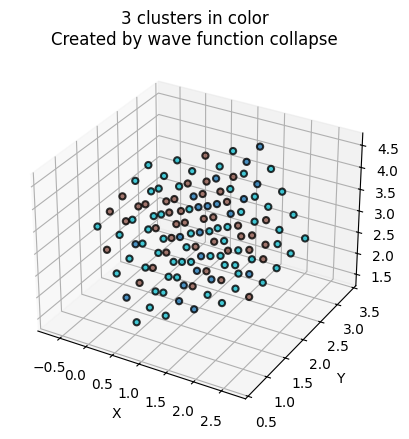

In [33]:
# Example
grid_size = (5,5,5)
nx, ny, nz = grid_size
grid = generate_qube(grid_size)
pts  = transform_points(
    grid,
    m=[1,2,3],
    rot_theta=120,
    rot_phi=120,
    transform_matrix=np.diag([1,1,1]),
    plot=False
)
neuron_type_array = wave_collapse(
    dims=grid_size,
    sparse_holes=0,
    sparsity_factor=0.9,
    probability_vector=[0.2,0.3,0.5],
    type_array=[0,1,2]
)
idx = find_positions_by_type(neuron_type_array, [0,1,2])
arrays = []
slice_size = ny * nz
row_size   = nz

for t in [0,1,2]:
    tripels = idx[t]                  # Form (K,3)
    flat_idx = (
        tripels[:,0] * slice_size    # i * (ny*nz)
      + tripels[:,1] * row_size      # j * nz
      + tripels[:,2]                  # k
    )
    cluster_pts = pts[flat_idx]       # Form (K,3)
    arrays.append(cluster_pts)

plot_point_clusters(arrays, title="3 clusters in color\nCreated by wave function collapse")

## How to use an array of functions to reposition the clusters individually

In [34]:
F = [[  
        lambda x, y, z: 2*x + 3*y - z,
        lambda x, y, z: 1.3*x - y + z**2,
        lambda x, y, z: 0.7*x**2 + y + 3],
     [
        lambda x, y, z: 1.5*x**2 + 2*y ,
        lambda x, y, z: -x + z**2,
        lambda x, y, z: x - 2*z**2
     ],
     [
        lambda x, y, z: -1.5*x**2 + y + z,
        lambda x, y, z: -0.5*x - y + z,
        lambda x, y, z: 1.7*x**2 - z*y 
     ]]

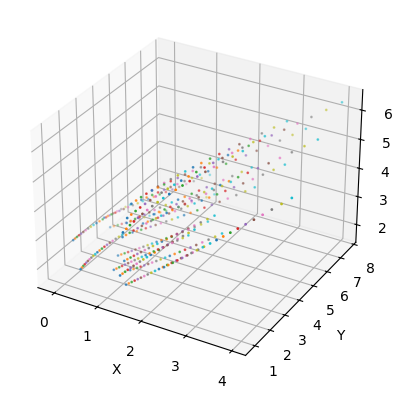

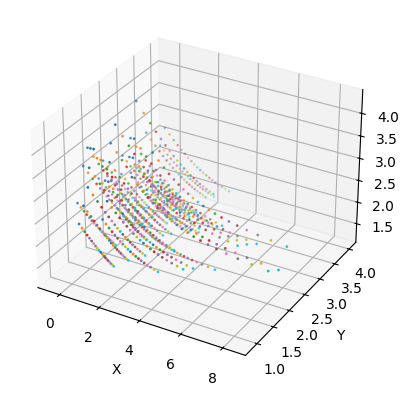

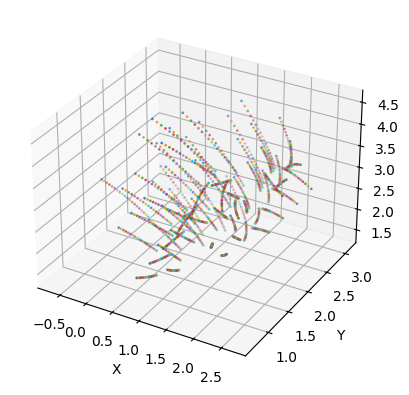

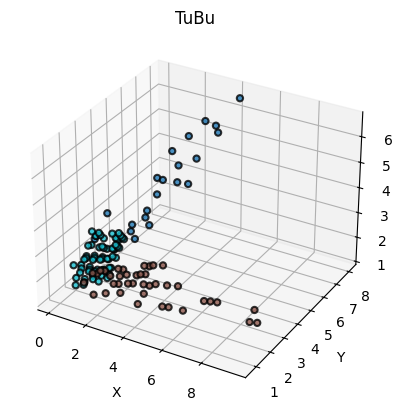

In [35]:
clusters = []
dt = 0.01
for i, pts in enumerate(arrays):
    final_positions = simulate_vector_field_flow(
        initial_positions=pts,
        dt=dt, #Whoever reads this, I'm terribly sorry. I truly am. 
        f1=F[i][0], 
        f2=F[i][1],
        f3=F[i][2],
        num_steps=20,
        plot=True,
        scatter_size=1.0
    )
    clusters.append(final_positions)
plot_point_clusters(clusters,title="TuBu")

## The picture below says more than I could in a comment.

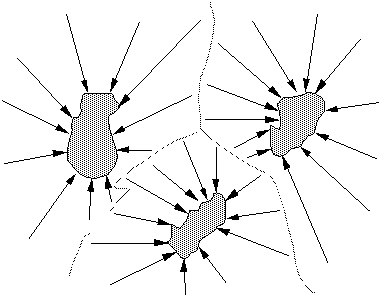

In [36]:
display(Image(filename='basin.gif'))

# Put that functionality into a function

In [37]:
def cluster_and_flow(
    grid_size,
    m,
    rot_theta,
    rot_phi,
    transform_matrix,
    wave_params,
    types,
    flow_functions,
    dt,
    num_steps,
    plot_clusters = True,
    title="Cluster-Flows"
):
    """
    1) Create a cubic grid
    2) Apply a one‐time transformation (rotate/translate/scale)
    3) Generate the `neuron_type_array` via `wave_collapse`
    4) Split the grid into sub‐arrays by type
    5) Simulate each sub‐array under its own flow field
    6) Plot all resulting clusters (optional)
    7) Return the list of final position arrays
    """
    # 2
    grid = generate_qube(grid_size)
    pts  = transform_points(grid, m=m, rot_theta=rot_theta,
                            rot_phi=rot_phi, transform_matrix=transform_matrix,
                            plot=False)
    # 3
    neuron_type_array = wave_collapse(
        dims = grid_size,
        sparse_holes     = wave_params['sparse_holes'],
        sparsity_factor  = wave_params['sparsity_factor'],
        probability_vector = wave_params['probability_vector'],
        type_array       = types
    )
    idx = find_positions_by_type(neuron_type_array, types)
    # 4
    nx, ny, nz = grid_size
    slice_size = ny * nz
    row_size   = nz
    arrays = []
    for t in types:
        tripels   = idx[t]
        flat_idx  = tripels[:,0]*slice_size + tripels[:,1]*row_size + tripels[:,2]
        arrays.append(pts[flat_idx])
    # 5
    clusters = []
    for (f1,f2,f3), cluster_pts in zip(flow_functions, arrays):
        final_positions = simulate_vector_field_flow(
            initial_positions=cluster_pts,
            dt=dt, f1=f1, f2=f2, f3=f3,
            num_steps=num_steps,
            plot=False, scatter_size=1.0,
            create_object=False
        )
        clusters.append(final_positions)
    # 6
    if plot_clusters:
        plot_point_clusters(clusters, title=title)
    # 7
    return clusters

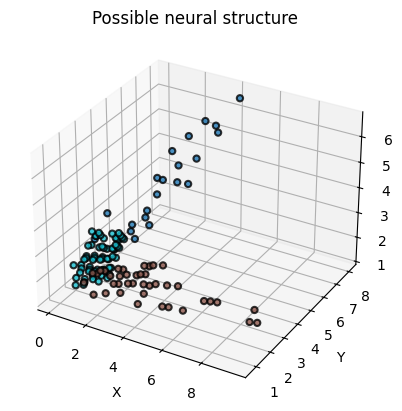

3

In [38]:
# Example

grid_size = (5,5,5)
m = array([1,2,3])
rot_theta, rot_phi = 120, 120
transform_matrix = diag([1,1,1])

wave_params = {
    'sparse_holes': 0,
    'sparsity_factor': 0.9,
    'probability_vector': [0.2,0.3,0.5]
}

types = [0,1,2]
flow_functions = [
    (lambda x,y,z: 2*x+3*y-z,
     lambda x,y,z: 1.3*x - y + z**2,
     lambda x,y,z: 0.7*x**2 + y + 3),
    (lambda x,y,z: 1.5*x**2 + 2*y,
     lambda x,y,z: -x + z**2,
     lambda x,y,z: x - 2*z**2),
    (lambda x,y,z:-1.5*x**2 + y + z,
     lambda x,y,z:-0.5*x - y + z,
     lambda x,y,z: 1.7*x**2 - z*y)
]

clusters = cluster_and_flow(
    grid_size=grid_size,
    m=m,
    rot_theta=rot_theta,
    rot_phi=rot_phi,
    transform_matrix=transform_matrix,
    wave_params=wave_params,
    types=types,
    flow_functions=flow_functions,
    dt=0.01,
    num_steps=20,
    plot_clusters=True,
    title="Possible neural structure"
)
len(clusters)# great

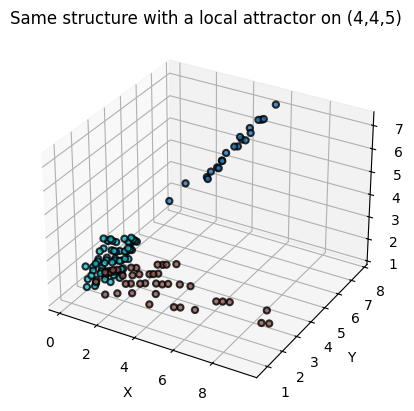

In [39]:
# Example with a local attractor
# Example with local attractor. same points. Attraction on (4,4,5)
"""def add_local_attractor(
    m = np.zeros(3),
    k = 15.0,      # Sog-Stärke
    sigma = 0.9,   # Gauß-Breite
    f1 = lambda x, y, z: np.zeros_like(x),
    f2 = lambda x, y, z: np.zeros_like(x),
    f3 = lambda x, y, z: np.zeros_like(x),
    repulsive=False)
""" #lets use that.

flow_functions = [
        add_local_attractor( 
            
            #returns (f1,f2,f3)
            # Type[0] gets some attraction-action
            
             f1 = lambda x,y,z: 2*x+3*y-z,
             
             f2=lambda x,y,z: 1.3*x - y + z**2,
             
             f3=lambda x,y,z: 0.7*x**2 + y + 3, k=10,sigma=2.5,m=np.array([4,4,5])
        ), 
    (
        # Type[1]
        lambda x,y,z: 1.5*x**2 + 2*y,
     
        lambda x,y,z: -x + z**2,
     
        lambda x,y,z: x - 2*z**2
    ),
    (
        # Type[2]
        lambda x,y,z:-1.5*x**2 + y + z,
     
        lambda x,y,z:-0.5*x - y + z,
     
        lambda x,y,z: 1.7*x**2 - z*y
    )
]


grid_size = (5,5,5)
m = array([1,2,3])
rot_theta, rot_phi = 120, 120
transform_matrix = diag([1,1,1])

wave_params = {
    'sparse_holes': 0,
    'sparsity_factor': 0.9,
    'probability_vector': [0.2,0.3,0.5]
}

types = [0,1,2]


clusters = cluster_and_flow(
    grid_size=grid_size,
    m=m,
    rot_theta=rot_theta,
    rot_phi=rot_phi,
    transform_matrix=transform_matrix,
    wave_params=wave_params,
    types=types,
    flow_functions=flow_functions,
    dt=0.01,
    num_steps=20,
    plot_clusters=True,
    title="Same structure with a local attractor on (4,4,5)"
)

# It's time to talk about the visual system. Due to the freedom of researching whatever fits the topic and after communicating my intention to connect the models to UNITY I sat down and thought of ways to make that happen.

# So I took multible (10+hrs) courses in C# and Unity and after creating 3 games I feel ready to build a simple level and objects for the SNN to control over TCP/IP.

# Turns out, the connection can be made extremely easy. You need a python script and you need unity. Unity generates x frames per second.

# Each time a frame is generated it computes the position and representation of every object in the field of view.

# that means at any time a frame is generated you can use the unity function of taking a screenshot of the field of view of one of the cameras, send it via tcp to the python script, turn it into an array of activations and connect these to the visual system. That's the whole idea right now.

# I want the agent to be able to "see". Not just "ya bro, here you have the distance to the next wall, if it beeps turn around"- stuff.

# 60Hz Input sounds like a reasonable number

# I want to make that happen by imitating the visual cortex of primates. Dunno where this goes.

# Agent ----- controls ----> Unity-Object 
# Unity-Object ----- sends Viewframe -----> Agent


In [40]:
# lets begin

# NEST

In [41]:
# 1.) Circle to CCW

In [42]:
circle = circle3d(
    n=100,
    r=1.0,
    theta=0,
    phi=90,
    m=(2,0,0),
    name="Circle floating in space",
    plot=False)


In [43]:
def create_CCW(
    positions,
    model='iaf_psc_alpha',
    plot=False,
    k=10.0,
    bidirectional = False,
    conn_dict_ex = {
        'rule': 'one_to_one'
    },
    syn_spec_ex = {
        'synapse_model': 'static_synapse',
        'weight': 30.0,
        'delay': 1.0
    },
    conn_dict_inh = {
        'rule': 'pairwise_bernoulli',
        'p': 1.0,
        'allow_autapses': False
    },
    syn_spec_inh = {
        'synapse_model': 'static_synapse',
        'weight': -k * nest.spatial.distance,
        'delay': 1.0
    },
    ):
    #~*~*~*~* START  *~*~*~*~#
    """
    Create a NEST neuron population at specified 3D positions.

    Args:
        conn_dict_ex, syn_spec_ex, conn_dict_inh, syn_spec_inh: dicts for the exh/inh synapses
        k(float): pA/mm
        plot(bool): the usual
        bidirectional(bool): creates exhib. Connections clockwise AND counterclockwise
        positions (np.ndarray): Array of shape (N,3) with (x,y,z) coordinates.
        model (str):           Name of the NEST neuron model to instantiate.

    Returns:
        list: List of NEST node IDs corresponding to the created neurons.
    """    
    #~*~*~*~* END  *~*~*~*~#
    
    
    positions=positions.tolist()
    nodes = nest.Create(model=model,positions=nest.spatial.free(pos=positions))
    
    if(plot):
        nest.PlotLayer(nodes)

    
    # connect the ring
    count=0

    for i in nodes:
        nest.Connect(i,nodes[(count+1)%len(nodes)],conn_dict_ex,syn_spec_ex)
        if(bidirectional):
            nest.Connect(nodes[(count+1)%len(nodes)],i,conn_dict_ex,syn_spec_ex)
            # for the case you don't want a signalgenerator but rather only one active area which can freely
            # slide in every direction on the circle 
        count+=1

    nest.Connect(nodes, nodes, conn_dict_inh, syn_spec_inh)

    # klappt.
    return nodes

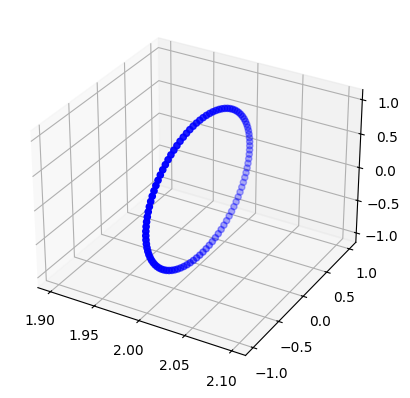

In [44]:
# Demo CCW any angle
ccw_nodes = create_CCW(circle,model='iaf_psc_alpha',plot=True,k=10.0, bidirectional = True)

# 2.) Record Spikes from CCW

In [45]:
def CCW_spike_recorder(ccw):
        
    #~*~*~*~* START  *~*~*~*~#
    """
    simply attaches spike recorder to every neuron in the CCW
    returns a list of tuples countaining theta->[n][0] (the angle relative to (1,0))
    in radians and the corresponding recorder->[n][1]
    """
    #~*~*~*~* END  *~*~*~*~#

    length = len(ccw)
    recorder_list = []
    for i, neuron in enumerate(ccw):
        theta = (i/length) * 2*np.pi
        spikerecorder = nest.Create("spike_recorder")
        nest.Connect(neuron, spikerecorder)
        recorder_list.append((theta,spikerecorder))#damit klar ist, in welche Richtung der Agent läuft
    return recorder_list


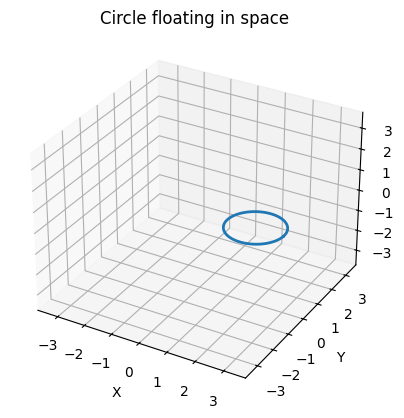

(3.141592653589793, NodeCollection(metadata=None, model=spike_recorder, size=1, first=251))


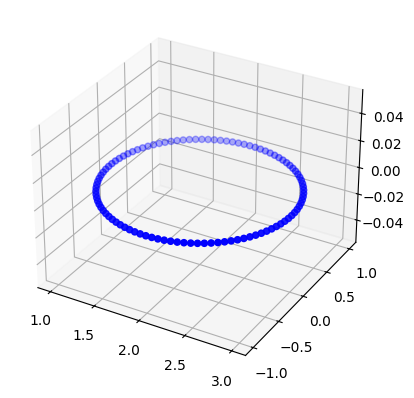

In [46]:
# Example

circle = circle3d(100,r=1.0,theta=0,phi=0,m=(2,0,0),name="Circle floating in space",plot=True)
ccw_nodes = create_CCW(circle,model='iaf_psc_alpha',plot=True,k=10.0, bidirectional = True)

spike_recorder_ccw = CCW_spike_recorder(ccw_nodes) # now every neuron has it's own Recorder. 
#pattern: [(theta_1,recorder_1),(theta_2,recorder_2),...]
print(spike_recorder_ccw[50])#Bei 100 Aufteilungen des Kreises sind wir nach 50 Schritten genau bei PI

# 3.) Connect the Cone -> this will become hugely important later...

In [47]:
def connect_cone(
    cone_points,
    k=10.0,
    model='iaf_psc_alpha',
    # 80 % exhib
    conn_dict_ex = {
        'rule': 'pairwise_bernoulli',
        'p': 0.8,
        'allow_autapses': False
    },
    syn_spec_ex = {
        'synapse_model': 'static_synapse',
        'weight': (((nest.spatial.target_pos.z - nest.spatial.source_pos.z)**2)**0.5),
        'delay': 1.0
    },
    # 20 % inhib
    conn_dict_inh = {
        'rule': 'pairwise_bernoulli',
        'p': 0.2,
        'allow_autapses': False
    },
    syn_spec_inh = {
        'synapse_model': 'static_synapse',
        'weight': -k * (
            ((nest.spatial.target_pos.x - nest.spatial.source_pos.x)**2
           + (nest.spatial.target_pos.y - nest.spatial.source_pos.y)**2)
           ** 0.5# dependency on x-y euclidean distance
        ),
        'delay': 1.0
    }
    ):
     #~*~*~*~* START *~*~*~*~#

    """
    Create a recurrent network on cone-shaped positions with both excitatory and inhibitory connections.

    Args:
        cone_points (np.ndarray): Array of shape (N,3) with (x,y,z) coordinates of cone.
        k (float):              Scaling factor for inhibitory synaptic weights.
        conn_dict_ex (dict):    Excitatory connection rule for nest.Connect.
        syn_spec_ex (dict):     Excitatory synapse specifications; weight func of z-distance.
        conn_dict_inh (dict):   Inhibitory connection rule for nest.Connect.
        syn_spec_inh (dict):    Inhibitory synapse specifications; weight func of xy-distance.

    Returns:
        list: NEST node IDs of the created cone network.
    """
    #~*~*~*~* END *~*~*~*~#
    
    nodes = nest.Create(model=model, positions=nest.spatial.free(pos=cone_points.tolist()))
    nest.Connect(nodes, nodes, conn_dict_ex, syn_spec_ex)
    nest.Connect(nodes, nodes, conn_dict_inh, syn_spec_inh)
    return nodes

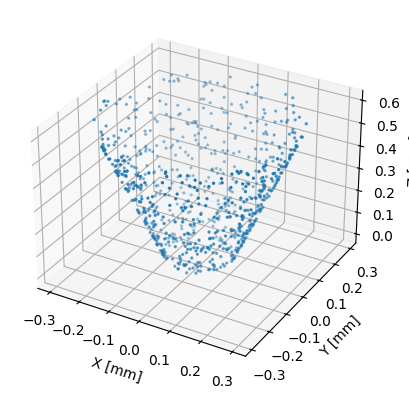

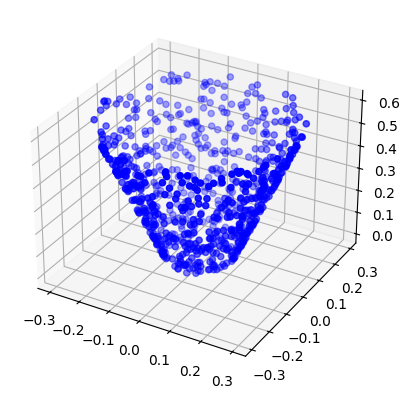

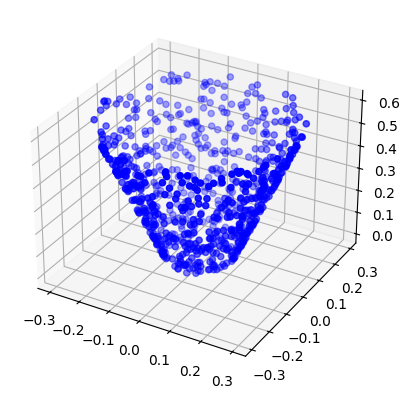

In [48]:
# Example:
n=800
cone_points = create_cone(rot_theta=0, n=n,rot_phi=0, plot=True,inner_radius=0.1,outer_radius=0.3,m=np.zeros(3))
cone_nodes = connect_cone(cone_points)
nest.PlotLayer(cone_nodes)

# 4.) Connect Cone and CCW

In [49]:
def connect_cone_ccw(
        cone, 
        ccw,              
        syn_spec_strong={'synapse_model':'static_synapse', 'weight':10.0, 'delay':1.0}, 
        syn_spec_weak  ={'synapse_model':'static_synapse', 'weight': 2.0, 'delay':1.0}, 
        angle_width_deg=15.0
    ):
        #~*~*~*~* START  *~*~*~*~#

    """
    Connects two NEST populations based on their azimuthal (XY-plane) angular proximity.

    Each neuron in `cone_nodes` is connected to each neuron in `ccw_nodes`.
    If the angular difference between their positions (in the XY-plane) is within
    `angle_width_deg`, the connection uses `syn_spec_strong`, otherwise `syn_spec_weak`.

    Args:
        cone_nodes (List[int]): List of NEST node IDs for the "cone" population.
        ccw_nodes  (List[int]): List of NEST node IDs for the "ccw" population.
        angle_width_deg (float): Angular window (in degrees) for strong connections.
        syn_spec_strong (dict): Synapse specification for connections within the angular window.
        syn_spec_weak   (dict): Synapse specification for connections outside the window.
        conn_spec       (dict): Connection rule dictionary for nest.Connect.

    Returns:
        None: Connections are created in the NEST kernel; nothing is returned.
    """
        #~*~*~*~* END  *~*~*~*~#

    
    # costly preprocessing
    conn_spec   = {'rule': 'one_to_one'}
    angle_width = np.deg2rad(angle_width_deg)


    pos_ccw  = nest.GetPosition(ccw)
    pos_cone = nest.GetPosition(cone)

    theta_ccw  = [ (np.arctan2(y, x) + 2*np.pi) % (2*np.pi) for x, y, _ in pos_ccw ]
    theta_cone = [ (np.arctan2(y, x) + 2*np.pi) % (2*np.pi) for x, y, _ in pos_cone ]

    for idx_i, i in enumerate(ccw):
        ti = theta_ccw[idx_i]
        for idx_j, j in enumerate(cone):
            tj = theta_cone[idx_j]
            delta = abs(tj - ti)
            delta = min(delta, 2*np.pi - delta)
            if delta < angle_width:
                nest.Connect(j, i, conn_spec, syn_spec_strong)
            else:
                nest.Connect(j, i, conn_spec, syn_spec_weak)

In [50]:
# example. 
# this structure was originally thought of a simple system for movement, but I think rebuilding the biological
# one is a) more fun and b) it may help to keep the structure of this network consistant.
connect_cone_ccw(cone_nodes, ccw_nodes)


# 5. Blob to Neuron Population

In [51]:
def create_blob_population(
    positions,
    conn_ex = {'rule': 'pairwise_bernoulli', 'p': 0.8, 'allow_autapses': False},
    syn_ex  = {'synapse_model': 'static_synapse', 'weight': 2.0, 'delay': 1.0},
    conn_in = {'rule': 'pairwise_bernoulli', 'p': 0.2, 'allow_autapses': False},
    syn_in  = {'synapse_model': 'static_synapse','weight': -10.0,'delay': 1.0},
    plot= False,
    neuron_type = "iaf_psc_alpha"
    ):
        #~*~*~*~* START  *~*~*~*~#

    """
    Create and connect a NEST population (“blob”) at specified 3D positions.

    Args:
        positions (np.ndarray): Array of shape (N,3) with neuron coordinates.
        conn_ex (dict):       Excitatory connection rule for nest.Connect.
        syn_ex (dict):        Excitatory synapse parameters.
        conn_in (dict):       Inhibitory connection rule for nest.Connect.
        syn_in (dict):        Inhibitory synapse parameters.
        neuron_type (str):    Name of the NEST neuron model to instantiate.
        plot (bool):          If True, show a 3D scatter of positions and PlotLayer.

    Returns:
        list: The list of NEST node IDs created.
    """
        #~*~*~*~* END  *~*~*~*~#

    blob_pop = nest.Create(
        neuron_type,
        positions.shape[0],
        positions=nest.spatial.free(positions.tolist())
    )

    nest.Connect(blob_pop, blob_pop, conn_ex, syn_ex)
    nest.Connect(blob_pop, blob_pop, conn_in, syn_in)

    if plot:
        from mpl_toolkits.mplot3d import Axes3D
        import matplotlib.pyplot as plt
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(positions[:,0], positions[:,1], positions[:,2], s=2)
        ax.set_xlabel('X [mm]')
        ax.set_ylabel('Y [mm]')
        ax.set_zlabel('Z [mm]')
        plt.show()
        nest.PlotLayer(blob_pop)
    return blob_pop

def blob(n = 100,
    m = np.zeros(3),
    r = 1.0,
    scaling_factor = 1.0,
    conn_ex = {'rule': 'pairwise_bernoulli', 'p': 0.8, 'allow_autapses': False},
    syn_ex  = {'synapse_model': 'static_synapse', 'weight': 2.0, 'delay': 1.0},
    conn_in = {'rule': 'pairwise_bernoulli', 'p': 0.2, 'allow_autapses': False},
    syn_in  = {'synapse_model': 'static_synapse','weight': -10.0,'delay': 1.0},
    plot= False,
    neuron_type = "iaf_psc_alpha"    
        ):
            #~*~*~*~* START  *~*~*~*~#
    """
    Create a spatially distributed “blob” of NEST neurons and interconnect them
    with specified excitatory and inhibitory rules.

    This function first generates `n` random 3D points within a sphere of radius `r`
    centered at `m`, scaled by `scaling_factor`. It then instantiates a NEST population
    of size `n` at these coordinates and connects the neurons pairwise according to
    the provided excitatory and inhibitory connection parameters.

    Args:
        n (int): Number of neurons to generate in the blob.
        m (np.ndarray): 3-vector specifying the center of the sphere.
        r (float): Radius of the sphere used for point generation.
        scaling_factor (float): Uniform scaling factor applied to all coordinates.
        conn_ex (dict): NEST connection rule for excitatory synapses.
        syn_ex (dict): Parameters for excitatory synapses (model, weight, delay).
        conn_in (dict): NEST connection rule for inhibitory synapses.
        syn_in (dict): Parameters for inhibitory synapses (model, weight, delay).
        plot (bool): If True, display a 3D scatter of neuron positions and invoke
                     NEST’s PlotLayer.
        neuron_type (str): Name of the NEST neuron model to create (e.g., "iaf_psc_alpha").

    Returns:
        list: List of NEST node IDs corresponding to the created neurons.
    """
    
            #~*~*~*~* END  *~*~*~*~#

    
    
    # Creates Blob.
    pos = blob_positions(
        n=n,
        m=np.zeros(3),
        r=1.0,
        scaling_factor=SCALING_FACTOR
    )
    blob_pop = create_blob_population(
        positions=pos,
        conn_ex=conn_ex,
        syn_ex=syn_ex,
        conn_in=conn_in,
        syn_in=syn_in,
        plot=plot,
        neuron_type = neuron_type
    )
    
    
    return blob_pop

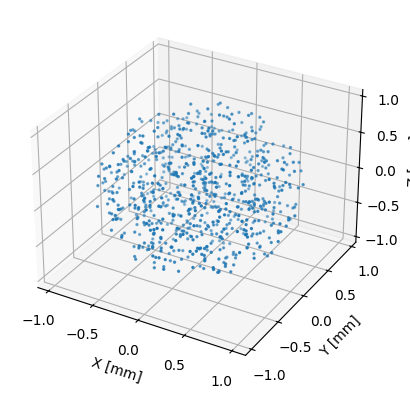

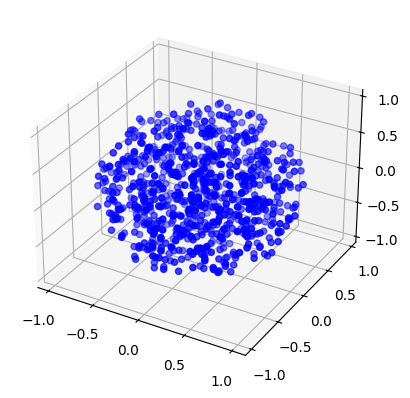

In [52]:
# Example
conn_ex = {'rule': 'pairwise_bernoulli', 'p': 0.8, 'allow_autapses': False}
syn_ex  = {'synapse_model': 'static_synapse', 'weight': 2.0, 'delay': 1.0}
conn_in = {'rule': 'pairwise_bernoulli', 'p': 0.2, 'allow_autapses': False}
syn_in  = {'synapse_model': 'static_synapse','weight': -10.0,'delay': 1.0}

blob_pop = blob(n = 800,
                r=2.5,
                m = np.array([7,7,7]),
                conn_ex=conn_ex,
                syn_ex=syn_ex,
                conn_in=conn_in,
                syn_in=syn_in,
                plot=True,
                neuron_type = "iaf_psc_alpha",
                scaling_factor = 1.0
               )

# 6.) Connect the Blob to the Cone

In [53]:
def connect_blob_cone(
    blob,
    cone,
    m = np.zeros(3),
    angle_width_deg = 10.0,
    conn_ex_c = {'rule': 'pairwise_bernoulli', 'p': 0.6, 'allow_autapses': False},
    conn_in_c  = {'rule': 'pairwise_bernoulli', 'p': 0.4, 'allow_autapses': False},
    generic_conn = {'rule': 'pairwise_bernoulli', 'p': 0.01, 'allow_autapses': False},
    generic_syn = {'synapse_model': 'static_synapse', 'weight': 1.0, 'delay': 1.5}
):
        #~*~*~*~* START  *~*~*~*~#

    """
    Connects two NEST populations ("blob" → "cone" and back) using:
      1. generic blob→cone connections (generic_conn, generic_syn)
      2. angle‐dependent cone→blob connections:
         - if Δθ ≤ angle_width_deg: excitatory (conn_ex_c, syn_ex_c)
         - else: inhibitory (conn_in_c, syn_in_c), with delay clipped to ≥1 ms

    """
        #~*~*~*~* END  *~*~*~*~#

    nest.Connect(blob, cone, generic_conn, generic_syn)


    half = np.deg2rad(angle_width_deg)
    pos_blob = np.array(nest.GetPosition(blob))
    pos_cone = np.array(nest.GetPosition(cone))
    th_blob  = (np.arctan2(pos_blob[:,1],pos_blob[:,0]) + 2*np.pi)% (2*np.pi)
    th_cone  = (np.arctan2(pos_cone[:,1],pos_cone[:,0]) + 2*np.pi)% (2*np.pi)
    blob_ids = nest.GetStatus(blob, 'global_id')
    cone_ids = nest.GetStatus(cone, 'global_id')

    pre_exc, post_exc, w_exc, d_exc = [], [], [], []
    pre_inh, post_inh, w_inh, d_inh = [], [], [], []

    for bid, tb, pB in zip(blob_ids, th_blob, pos_blob):
        for cid, tc, pC in zip(cone_ids, th_cone, pos_cone):
            delta = abs(tc - tb)
            delta = min(delta, 2*np.pi - delta)
            if delta <= half:
                pre_exc.append(cid)
                post_exc.append(bid)

                dist = np.linalg.norm(pC - pB)
                w_exc.append(2.4 + 1.2 * dist)
                d_exc.append(1.0)
            else:
                pre_inh.append(cid)
                post_inh.append(bid)
                dx, dy = pC[0] - m[0], pC[1] - m[1]
                w_inh.append(1.0 + dx*dx + dy*dy)
                raw = np.random.exponential(scale=2.0) * np.linalg.norm(pC - pB)
                d_inh.append(max(raw, 1.0))

    if pre_exc:
        nest.Connect(
            pre_exc, post_exc,
            {'rule':'one_to_one'},
            {'synapse_model':'static_synapse',
             'weight': np.array(w_exc),
             'delay':  np.array(d_exc)}
        )
    if pre_inh:
        nest.Connect(
            pre_inh, post_inh,
            {'rule':'one_to_one'},
            {'synapse_model':'static_synapse',
             'weight': np.array(w_inh),
             'delay':  np.array(d_inh)}  # now >= 1
        )

In [54]:
connect_blob_cone(blob_pop,cone_nodes)

## 7.) Grid to Visual (just a silly example, we'll build the visual system in another way.)

In [55]:
def grid2visual(
                grid,
                K=10,
                m=np.array([0.0,0.0,0.0]),
                syn_dict_ex = {
                    "synapse_model": "static_synapse",
                    "weight": 50.0,    
                    "delay": 1.0       
                },
                syn_dict_in = {
                    "synapse_model": "static_synapse",
                    "weight": -40.0,   
                    "delay": 1.0       
                },
                conn_dict_ex = {
                    "rule": "pairwise_bernoulli",
                    "p": 0.7,                
                    "allow_autapses": False
                },
                syn_spec_ex = {
                    "synapse_model": "static_synapse",
                    "weight": 30.0,          
                    "delay": 1.5             
                },
                conn_dict_inh = {
                    "rule": "pairwise_bernoulli",
                    "p": 0.3,                
                    "allow_autapses": False
                },
                syn_spec_inh = {
                    "synapse_model": "static_synapse",
                    "weight": -60.0,         
                    "delay": 1.5             
                },
                conn_dict_layer = {
                    "rule": "all_to_all",    
                    "allow_autapses": False
                },
                syn_dict_layer = {
                    "synapse_model": "stdp_synapse",
                    "alpha": 1.0,            
                    "lambda": 0.01,          
                    "tau_plus": 20.0         
                }
    ):
        #~*~*~*~* START  *~*~*~*~#

    """
    Build a layered spiking neural network from a list of 3D grid layers,
    apply feed-forward Poisson input and noise to the first layer, connect
    successive layers with STDP synapses, and project the final layer into
    a visual blob population.

    Args:
        grid: A list of 3D coordinate arrays, one per layer (shape (Ni, 3)).
        K: Unused placeholder parameter for future extensions.
        syn_dict_ex: Excitatory synapse spec for Poisson input to the first layer.
        syn_dict_in: Inhibitory synapse spec for noise input to the first layer.
        conn_dict_ex: Connection rule for the final layer → blob excitatory mapping.
        syn_spec_ex: Synapse spec for the final layer → blob excitatory mapping.
        conn_dict_inh: Connection rule for the final layer → blob inhibitory mapping.
        syn_spec_inh: Synapse spec for the final layer → blob inhibitory mapping.
        conn_dict_layer: Connection rule for inter-layer connections.
        syn_dict_layer: Synapse spec (STDP) for inter-layer connections.

    Returns:
        poisson_generators: IDs of Poisson generators providing excitatory input.
        noise_generators: IDs of Poisson generators providing inhibitory noise.
        populations: List of neuron ID lists, one for each grid layer.
        blob_pop: Neuron ID list of the final visual blob population.
    """
        #~*~*~*~* END  *~*~*~*~#

    
    length = 0
    populations = []
    poisson_generators = []
    noise_generators = []
    
    for i,layer in enumerate(grid):
        length+=1
        pop = nest.Create("iaf_psc_alpha",len(layer.tolist()),positions=nest.spatial.free(layer.tolist()))
        if i==0:
            for neuron in pop:
                ex = nest.Create("poisson_generator")
                noise = nest.Create("poisson_generator")
                nest.Connect(ex, neuron, syn_spec=syn_dict_ex)
                nest.Connect(noise, neuron, syn_spec=syn_dict_in)
                poisson_generators.append(ex)
                noise_generators.append(noise)
                #simnulate the receptive field through poisson generators 
        populations.append(pop)
       
        
    
    blob_pop = blob(n=800,plot=False,m=m)
    
    
    for idx in range(len(populations)-1):# all except for the last layer
        nest.Connect(
            populations[idx],
            populations[idx+1],
            conn_spec=conn_dict_layer,
            syn_spec=syn_dict_layer
        )
    
    # Final layer -> visual blob: inhibitory mapping
    
    nest.Connect(populations[-1], blob_pop, conn_dict_ex, syn_spec_ex)
    nest.Connect(populations[-1], blob_pop, conn_dict_inh, syn_spec_inh)
    
    return poisson_generators, noise_generators, populations, blob_pop




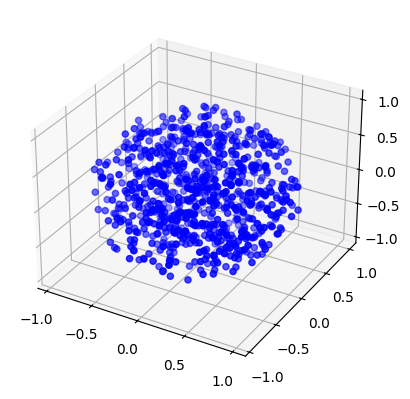

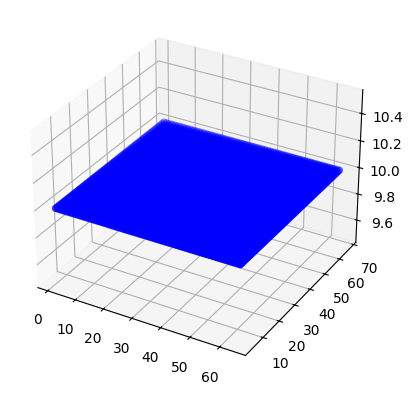

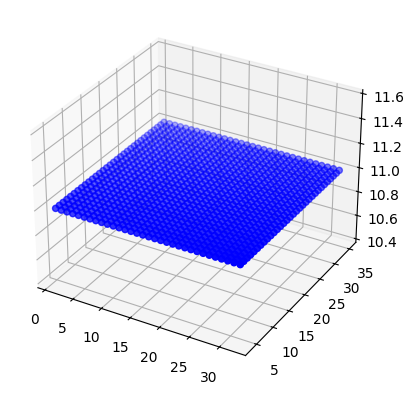

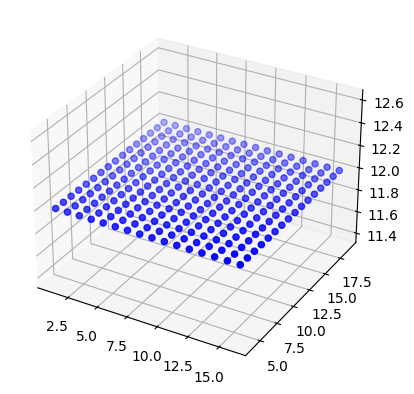

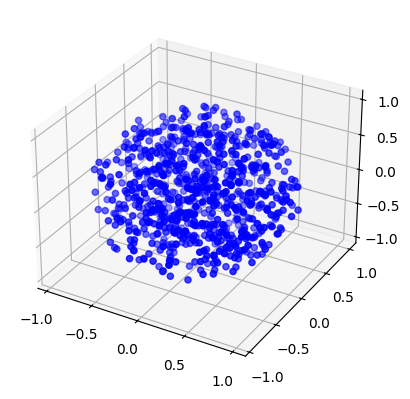

In [56]:
# Example. Just to show that it works. If a simplified model is required.

poisson_in, noise_in, populations, visual_blob = grid2visual(a)
        
for i,layer in enumerate(populations):
    #print(f'Layer {i}:')
    nest.PlotLayer(layer)
nest.PlotLayer(visual_blob)

## 8.) Give the agent the ability to "see" 

In [57]:
def input_to_receptive_field(image_array, poisson_generators, max_rate=200.0):
    """
    Map a grayscale image into Poisson input rates for a corresponding array of spike generators.

    Each pixel (0–255) is linearly scaled to a firing rate between 0 and `max_rate` Hz,
    then assigned to the matching Poisson generator.

    Args:
        image_array (np.ndarray):
            Input image of arbitrary shape, with values in [0, 255].
        poisson_generators (List[int]):
            List of NEST Poisson generator IDs; length must match image_array.size.
        max_rate (float):
            Maximum firing rate (Hz) corresponding to pixel value 255.

    Notes:
        - If `image_array.size` ≠ `len(poisson_generators)`, the mismatch is currently ignored.
          You may wish to add error handling for length mismatches.
    """
    if image_array.size != len(poisson_generators):
        print("POISSON_GENERATOR ANZAHL ENTSPRICHT NICHT DER GRÖßE DES IMAGE_ARRAYS!!!ELF\nTipp: Funktion input_to_receptive_field ist das Problem\n")
        pass # da es noch genug zu tun gibt, überspringe ich jetzt sowas. WITH GREAT POWER COMES GREAT RESPONSIBILITY


    flat_image = image_array.flatten()
    scaled_rates = (flat_image / 255.0) * max_rate

    for i, rate in enumerate(scaled_rates):#the timing scares me.
        nest.SetStatus([poisson_generators[i]], {'rate': float(rate)})

## 9.) Clusters to Neurons

In [58]:
def clusters_to_neurons(
    clusters, 
    neuron_models
    ):
    """
    Create NEST neuron populations from clusters of 3D coordinates.

    Args:
        clusters (List[np.ndarray]):
            A list of NumPy arrays, each of shape (K_i, 3), representing the (x, y, z)
            positions of K_i neurons in cluster i.
        neuron_models (List[str]):
            A list of NEST neuron model names (e.g. "iaf_psc_alpha", "izhikevich",
            "hh_psc_alpha"), one for each cluster. Must have the same length as `clusters`.

    Returns:
        List[nest.NodeCollection]:
            A list of NodeCollections, one per cluster, containing the created neurons
            of the specified model placed at the given positions.
    """
    populations = []
    for idx, pts in enumerate(clusters):
        model = neuron_models[idx]

        n_cells = pts.shape[0]

        nodes = nest.Create(n=n_cells, model=model,positions=nest.spatial.free(pos=pts.tolist()))


        populations.append(nodes)
    return populations



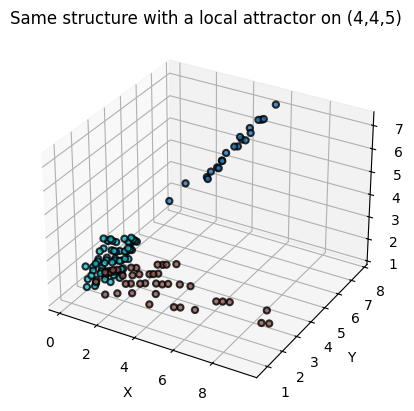

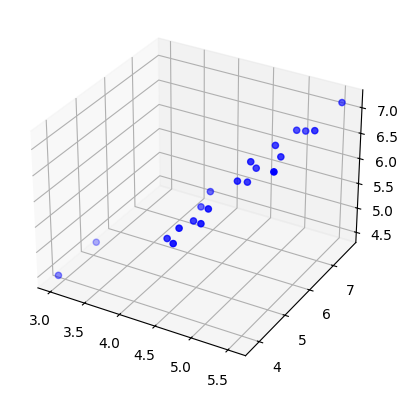

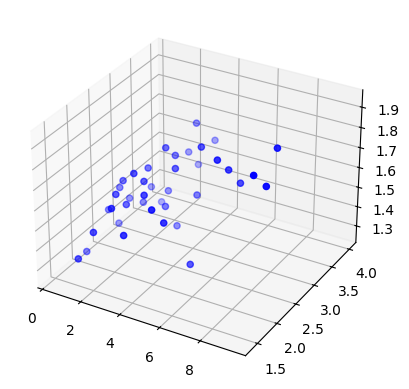

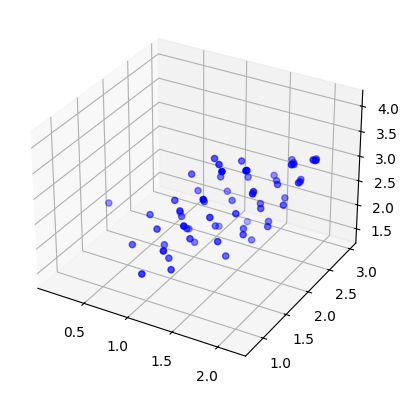

In [59]:
clusters = cluster_and_flow(
    grid_size=grid_size,
    m=m,
    rot_theta=rot_theta,
    rot_phi=rot_phi,
    transform_matrix=transform_matrix,
    wave_params=wave_params,
    types=types,
    flow_functions=flow_functions,
    dt=0.01,
    num_steps=20,
    plot_clusters=True,
    title="Same structure with a local attractor on (4,4,5)"
)
neuron_models = ["iaf_psc_alpha", "izhikevich", "hh_psc_alpha"]
populations = clusters_to_neurons(clusters, neuron_models)
for pop in populations:
    nest.PlotLayer(pop)# it works fine

# Okay, I think this is enough to build a primitive Model from Scratch using the neuron models available in NEST

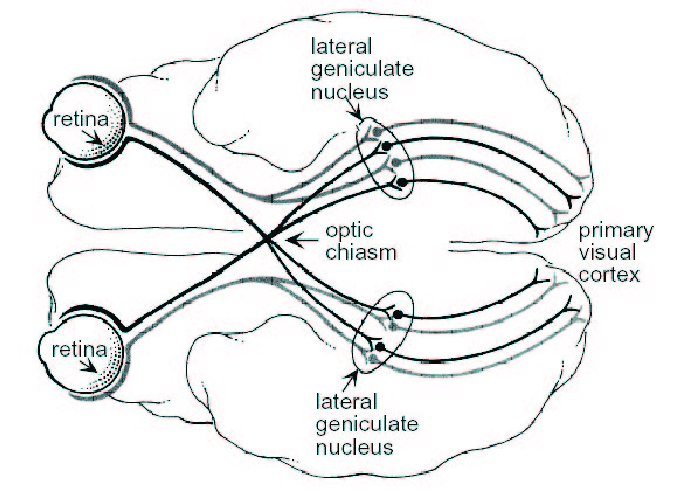

In [60]:
display(Image(filename='monkey_visual.png'))

# Yea, so. I will combine the functions above to at least come somehow closer to this.
# I need to find out what regions are important, what happens at every stage, THE NEURON TYPES AND THEIR CONNECTIVITY
# PATTERN, or at least some vague sense if it and i need to find out how many layers there are and what makes them 
# special.

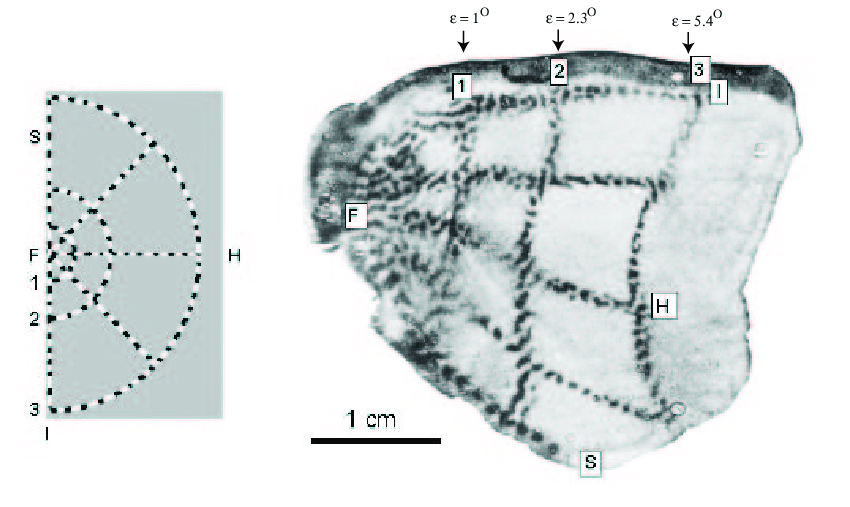

In [61]:
display(Image(filename='autoradiograph.png'))


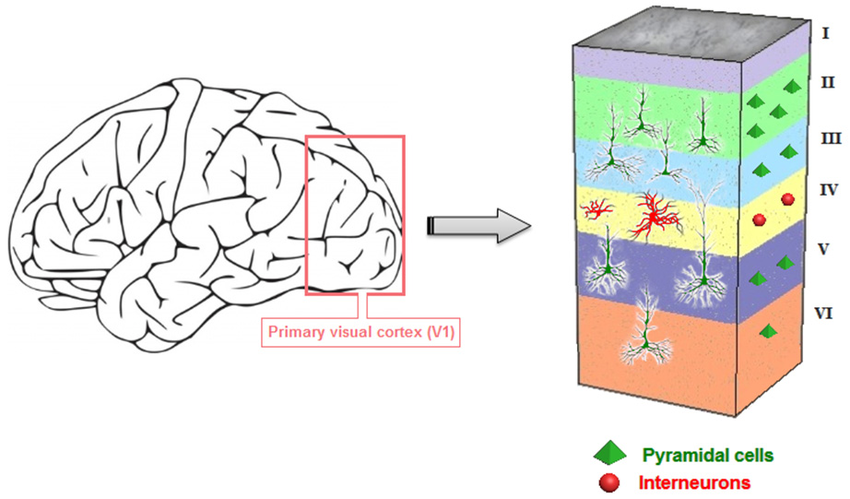

In [62]:
display(Image(filename='visual cortex neurons.png'))

# Building an extremely simplified and poorly designed model of the visual cortex. Pls dont exmatriculate me for this.

In [63]:
"""plot=True
v1_inner_rad = 0.1
v1_outter_rad = 0.15
v2_inner_rad = v1_outter_rad
v2_outter_rad = 0.20
v3_inner_rad = v2_outter_rad
v3_outter_rad = 0.30
v4_inner_rad = v3_outter_rad
v4_outter_rad = 0.40
v5_inner_rad = v4_outter_rad
v5_outter_rad = 0.45
v6_inner_rad = v5_outter_rad
v6_outter_rad = 0.5
"""


def xy_distance(a, b):
    # ignore z: lateral distance
    return np.linalg.norm(a[:2] - b[:2])

def eye_lgn_layer(gsl = 16,plot=False): # grid side length
    eye_layer_size = [gsl,gsl,gsl,gsl,gsl,gsl,gsl,gsl] #r,g,b,light,ganglia_r,ganglia_g, ganglia_b

    lgn_layer_size = [gsl,gsl,gsl,gsl,gsl] #not so sure anymore about 2x2 sight split. 
    # maybe just attach to different layers
    # r,g,b,light,merge_layer-> project
    # gsl grid side length


    eye_1 = create_Grid(m = np.array([1,gsl,10]),grid_size_list = eye_layer_size, plot = False, rot_phi = 0)
    eye_2 = create_Grid(m = np.array([1,-2*gsl,10]),grid_size_list = eye_layer_size, plot = False, rot_phi = 0)


    LGN_1 = create_Grid(m = np.array([20,gsl,15]),grid_size_list = lgn_layer_size, plot = False, rot_phi = 0)
    LGN_2 = create_Grid(m = np.array([20,-2*gsl,15]),grid_size_list = lgn_layer_size, plot = False, rot_phi = 0)



    V1_projection = create_Grid(m = np.array([10,0,0]),grid_size_list=[gsl],rot_theta=0.0,rot_phi=90)



    if plot:
        eyes = eye_1 + eye_2
        plot_point_clusters(eyes,marker_size = 10, alpha = 0.5,linewidths=0.1)
        plot_point_clusters_normalized(eyes,marker_size = 2, alpha = 0.5,linewidths=0.1)
        lgns = LGN_1 + LGN_2
        plot_point_clusters(lgns,marker_size = 10, alpha = 0.5,linewidths=0.1)
        plot_point_clusters_normalized(lgns,marker_size = 2, alpha = 0.5,linewidths=0.1)
    return [eye_1,eye_2,LGN_1,LGN_2,V1_projection]

| Areal       | Exzit. Zellgruppe (NEST-Modell, % vom Areal)                                                                                                                                                                                                                                                                                 | Hemmende Zellgruppe (Modell, %)                                                                      | Warum genau diese Mischung?                                                                                                                                              |
| ----------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------ |
| **V1**      | • 35 % **`iaf_cond_alpha`** – klassische *Simple cells* (Orientierung, Phase)  <br>• 25 % **`aeif_cond_alpha`** – *Complex cells* (Positions­invarianz, Bewegungs­vorverarbeitung) <br>• 10 % **`iaf_cond_exp`** – *Blob*-Farbzellen (kein Adaption nötig) <br>• 5 % **`hh_psc_alpha`** – große *Meynert*-Projektoren (→ MT) | 20 % **`iaf_cond_alpha`** (Basket + SOM), 5 % davon als **`iaf_cond_beta_gap`** (PV + Gap-Junctions) | V1 braucht schnelle lineare IF-Zellen für präzises Timing, aber auch adaptierende Komplex­zellen. Die Meynert-Subpopulation rechtfertigt einen detaillierteren HH-Kanal. |
| **V2**      | • 30 % `aeif_cond_alpha` – Orientierungs-/Kontur-Integration (blasse Streifen) <br>• 15 % `iaf_cond_exp` – Farbzellen (dünne Streifen) <br>• 20 % `aeif_cond_alpha` – Disparität/Bewegung (dicke Streifen, stärker adaptierend) <br>• 5 % `hh_psc_alpha` – Projektoren zu V4/MT                                              | 25 % `iaf_cond_alpha` (inkl. SOM + VIP), 5 % Gap-gekoppelt                                           | V2 verknüpft Merkmale → *aeif* wichtig. Parvo-Farbpfad braucht nicht viel Adaption – LIF reicht.                                                                         |
| **V3**      | • 30 % `aeif_cond_alpha` – Richtungs-/Form-Kombi (V3d) <br>• 15 % `iaf_cond_exp` – Form+Farbe (V3v) <br>• 15 % `aeif_cond_alpha` – Disparitäts-Spezialisten  <br>• 5 % `hh_psc_alpha` – großzellige Projektion zu MT                                                                                                         | 20 % `iaf_cond_alpha` (FS-IN), 15 % `iaf_cond_beta_gap` (Synchrony-IN)                               | V3 mischt Magno & Parvo, daher heterogen. Schnelle Hemmung nötig für Bewegungs­feintuning.                                                                               |
| **V4**      | • 25 % `aeif_cond_alpha` – Kurven/Shape-Primitives (adaptiv) <br>• 25 % `iaf_cond_exp` – reine Farb-Cluster („Globs“) <br>• 10 % `hh_psc_alpha` – langaxige Projektionen zu IT/PFC <br>• 5 % `gif_cond_exp` – daten­gefittete Spezialzellen (optional, wenn man Neuropixel-Daten einspielen will)                            | 15 % `iaf_cond_alpha`, 10 % `iaf_cond_beta_gap` (Gamma-Aufmerksamkeitsrhythmus)                      | V4 rechnet viel *feature binding* → AdEx + Gif. Farbcluster sind statisch, deshalb LIF-exp genügt.                                                                       |
| **V5 / MT** | • 45 % `iaf_cond_alpha` – *Component-motion* Zellen (schnell, kaum Adaption) <br>• 25 % `aeif_cond_alpha` – *Pattern-motion* Zellen (brauchen Adapt./Integration) <br>• 5 % `hh_psc_alpha` – tiefe Projektionspyramiden (→ MST) <br>• 5 % `izhikevich` – bursting „special-purpose“ Zellen (z. B. spiral flow)               | 15 % `iaf_cond_alpha` (FS-IN), 5 % `iaf_cond_beta_gap` (Richtungs-Kontrast, Synchronie)              | MT muss extrem schnell reagieren – überwiegend kurzer τ LIF. Pattern-Cells brauchen konvergente AdEx.                                                                    |
| **V6**      | • 35 % `iaf_cond_alpha` – Orientierungs-Hi-Fidelity (lange Linien) <br>• 25 % `aeif_cond_alpha` – Großfeld-Flow (Adaption an Eigenbewegung) <br>• 10 % `hh_psc_alpha` – Projektoren zu V6A/Parietal <br>• 5 % `iaf_psc_delta` – „Alarm-Spiker“ (kein Syn-Nachlauf, sofortige Reaktion)                                       | 20 % `iaf_cond_alpha` (weite Hemm-Felder), 5 % `iaf_cond_beta_gap` (Phase-Reset bei Kopfbewegung)    | V6 braucht weite konduktante LIF-Zellen + adaptierende Großfeld-Detektoren. Alarm-Spiker modellieren schnelle Fluchtreaktionen.                                          |


In [64]:
def vis_cortex_pos(
    gsl          = 16,           # grid side length
    col_height   = 2.0,          
    cells_per_col= 140,          
    rot_xy       = (0.0, 90.0),        
    grid_size        = None,
    rot_theta        = 0,
    rot_phi          = 0,
    transform_matrix = np.diag([1,1,1]),
    dt               = 0.01,
    area_specs = None,
    flow_functions = None,
    experiments = None,
    plot=False):

    if grid_size is None:
        grid_size=np.array([gsl,gsl,gsl])
    if area_specs is None:
        area_specs = {
            "V1": dict(offset_x=10, inner=0.10, outer=0.15),
            "V2": dict(offset_x= 8, inner=0.15, outer=0.20),
            "V3": dict(offset_x= 6, inner=0.20, outer=0.30),
            "V4": dict(offset_x= 4, inner=0.30, outer=0.40),
            "V5": dict(offset_x= 2, inner=0.40, outer=0.45),
            "V6": dict(offset_x= 0, inner=0.45, outer=0.50),
        }
    if experiments is None:
        experiments = {
            "V1C": dict(
                m               = np.array([0,0,-9]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.35,0.25,0.10,0.05,0.20,0.05]),
                types           = [0,1,2,3,4,5],
                num_steps       = 10,
                title           = "V1 computational body"
            ),

            "V2C": dict(
                m               = np.array([0,0,-7]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.30,0.15,0.20,0.05,0.25]),
                types           = [0,1,2,3,4],
                num_steps       = 10,
                title           = "V2 computational body"
            ),
                "V3C": dict(
                m               = np.array([0,0,-5]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.3,0.15,0.15,0.05,0.2]),
                types           = [0,1,2,3,4],
                num_steps       = 10,
                title           = "V3 computational body"
            ),
                "V4C": dict(
                m               = np.array([0,0,-3]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.25,0.25,0.1,0.05,0.15,0.1]),
                types           = [0,1,2,3,4,5],
                num_steps       = 10,
                title           = "V4 computational body"
            ),
                "V5C": dict(
                m               = np.array([0,0,-1]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.45,0.25,0.1,0.1,0.1]),
                types           = [0,1,2,3,4],
                num_steps       = 10,
                title           = "V5 computational body"
            ),
                "V6C": dict(
                m               = np.array([0,0,1]),
                wave_params     = dict(sparse_holes=0,
                                       sparsity_factor=0.8,
                                       probability_vector=[0.35,0.25,0.1,0.05,0.2,0.05]),
                types           = [0,1,2,3,4,5],
                num_steps       = 10,
                title           = "V6 computational body"
            )
        }


    if flow_functions is None:
        f1 = lambda x,y,z : 1.0/(0.3*x**2 + 0.3*y**2 + 0.15)
        flow_functions = [(lambda x,y,z:x,
                           lambda x,y,z:y,
                           f1)] * 6  # same tripples, list operation



    results = {}
    all_columns  = {} 



    for name, spec in area_specs.items():

        grid_layers   = create_Grid(
            m           = np.array([spec["offset_x"], 0, 0]),
            grid_size_list=[gsl],
            rot_theta   = rot_xy[0],
            rot_phi     = rot_xy[1],
            plot        = False
        )
        projection_xy = grid_layers[0]

        columns = []
        for center in projection_xy:
            col_pts = create_cone(
                m             = center,
                n             = cells_per_col,
                inner_radius  = spec["inner"],
                outer_radius  = spec["outer"],
                height        = col_height,
                rot_theta     = 0.0,
                rot_phi       = 0.0,
                plot          = False
            )
            columns.append(col_pts)
        all_columns[name] = columns




    for name, cfg in experiments.items():
        res = cluster_and_flow(
            grid_size      = grid_size,
            m              = cfg["m"],
            rot_theta      = rot_theta,
            rot_phi        = rot_phi,
            transform_matrix = transform_matrix,
            wave_params    = cfg["wave_params"],
            types          = cfg["types"],
            flow_functions = flow_functions,
            dt             = dt,
            num_steps      = cfg["num_steps"],
            plot_clusters  = plot,
            title          = cfg["title"]
        )
        results[name]=res


    if plot:
        for name, cols in all_columns.items():
            plot_point_clusters(cols,
                                marker_size = 2,
                                alpha       = 0.6,
                                linewidths  = 0.1,
                                title       = f"{name}-Säulen ({len(cols)} Stück)")
    return results, all_columns

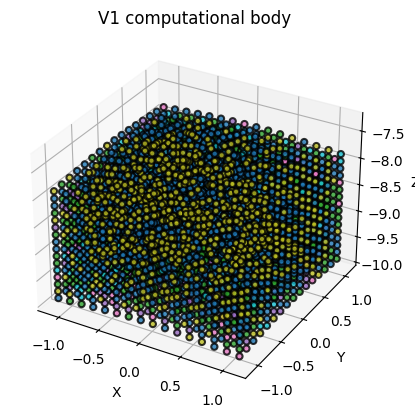

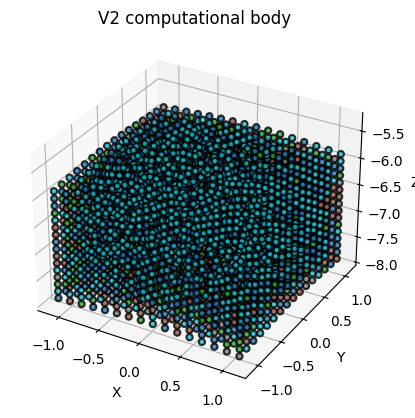

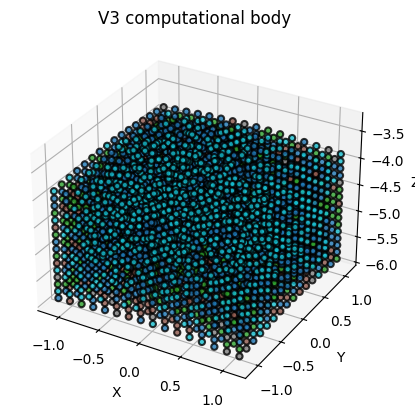

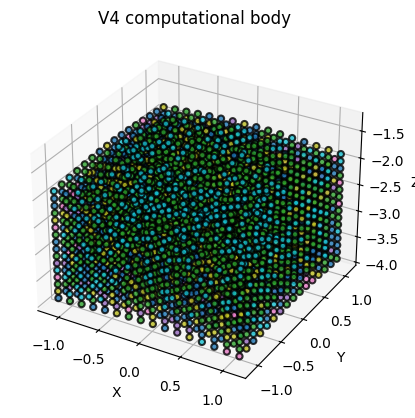

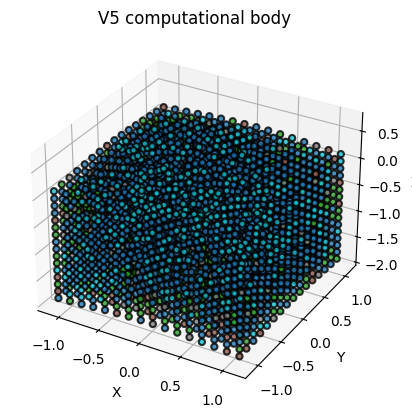

...

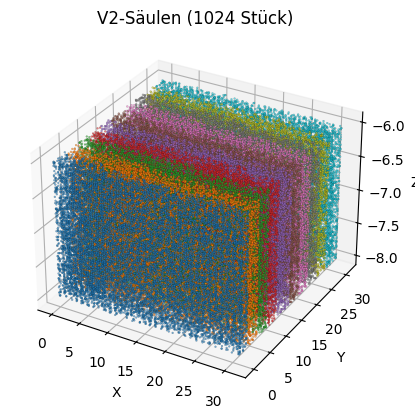

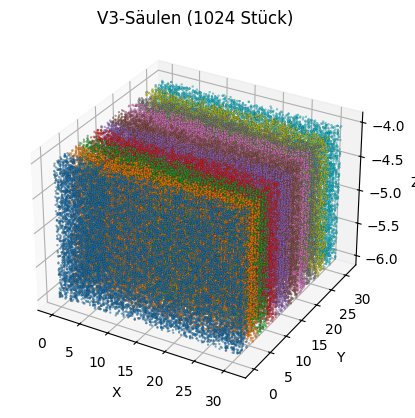

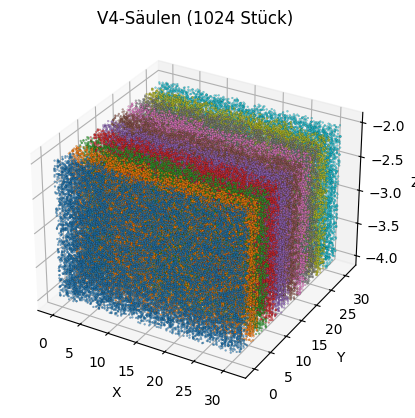

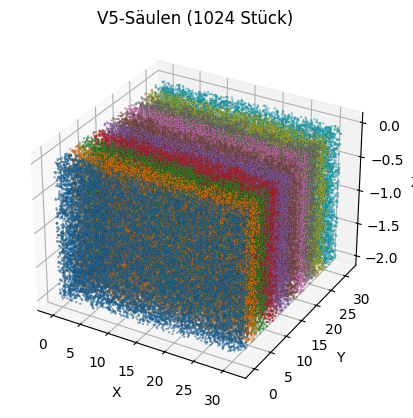

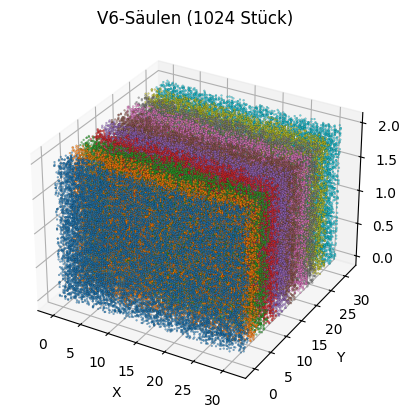

In [65]:
Vn_pop, Vn_cols  = vis_cortex_pos(gsl=16,plot=True)
Vn_pop_test, Vn_cols_test  = vis_cortex_pos(gsl=32,plot=True)

In [66]:
def vis2neurons(
    Vn_pop,
    area2models=None,
    plot=False
    ):
    
    model_alias = {"iaf_cond_beta_gap": "iaf_cond_alpha"}
    if(area2models is None):
        area2models = {
            "V1": ["iaf_cond_alpha","aeif_cond_alpha","iaf_cond_exp",
                   "hh_psc_alpha","iaf_cond_alpha","iaf_cond_beta_gap"],
            "V2": ["aeif_cond_alpha","iaf_cond_exp","aeif_cond_alpha",
                   "hh_psc_alpha","iaf_cond_alpha"],
            "V3": ["aeif_cond_alpha","iaf_cond_exp","aeif_cond_alpha",
                   "hh_psc_alpha","iaf_cond_alpha"],               
            "V4": ["aeif_cond_alpha","iaf_cond_exp","hh_psc_alpha",
                   "gif_cond_exp","iaf_cond_alpha","iaf_cond_beta_gap"],
            "V5": ["iaf_cond_alpha","aeif_cond_alpha","hh_psc_alpha",
                   "izhikevich","iaf_cond_beta_gap"],
            "V6": ["iaf_cond_alpha","aeif_cond_alpha","hh_psc_alpha",
                   "iaf_psc_delta","iaf_cond_alpha","iaf_cond_beta_gap"]
        }
    Vn_neurons = {}
    for exp_name, clusters in Vn_pop.items():
        models = [model_alias.get(m, m) for m in area2models[exp_name[:2]]]
        models = (models * ((len(clusters) + len(models) - 1) // len(models)))[:len(clusters)]
        Vn_neurons[exp_name] = clusters_to_neurons(clusters, models)
    if(plot):
        for exp_name, cluster_pops in Vn_neurons.items():    
            for pop in cluster_pops:                         
                nest.PlotLayer(pop)
    return Vn_neurons

# Lets turn these finally into something we can work with.

In [67]:
nest.ResetKernel()
area2models = {
    
    "V1": ["iaf_cond_alpha","aeif_cond_alpha","iaf_cond_exp","hh_psc_alpha","iaf_cond_alpha","iaf_cond_beta_gap"],
    
    "V2": ["aeif_cond_alpha","iaf_cond_exp","aeif_cond_alpha","hh_psc_alpha","iaf_cond_alpha"],
    
    "V3": ["aeif_cond_alpha","iaf_cond_exp","aeif_cond_alpha","hh_psc_alpha","iaf_cond_alpha"], 
    
    "V4": ["aeif_cond_alpha","iaf_cond_exp","hh_psc_alpha","gif_cond_exp","iaf_cond_alpha","iaf_cond_beta_gap"],
    
    "V5": ["iaf_cond_alpha","aeif_cond_alpha","hh_psc_alpha","izhikevich","iaf_cond_beta_gap"],
    
    "V6": ["iaf_cond_alpha","aeif_cond_alpha","hh_psc_alpha","iaf_psc_delta","iaf_cond_alpha","iaf_cond_beta_gap"]
    
}


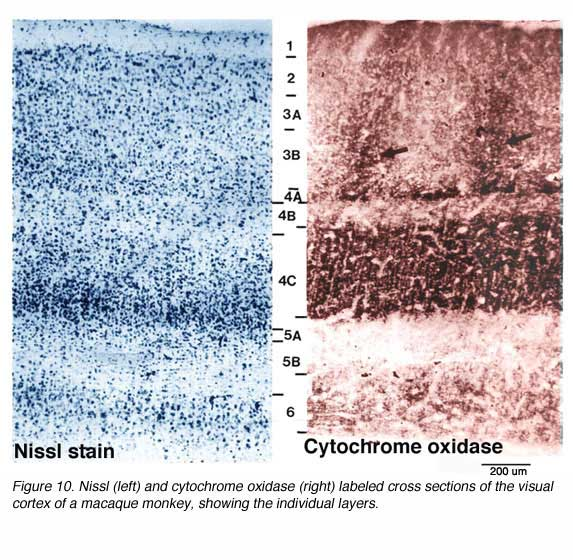

In [68]:
display(Image(filename='nissl-co1.jpg'))

In [69]:
neuro_pop = vis2neurons(Vn_pop,plot=False,area2models=area2models)
(V1_iaf_cond_alpha,
 V1_aeif_cond_alpha, 
 V1_iaf_cond_exp, 
 V1_hh_psc_alpha, 
 V1_iaf_cond_alpha, 
 V1_iaf_cond_beta_gap) = neuro_pop['V1C']

(V2_aeif_cond_alpha,
 V2_iaf_cond_exp,
 V2_aeif_cond_alpha,
 V2_hh_psc_alpha,
 V2_iaf_cond_alpha) = neuro_pop['V2C']

(V3_aeif_cond_alpha,
 V3_iaf_cond_exp,
 V3_aeif_cond_alpha,
 V3_hh_psc_alpha,
 V3_iaf_cond_alpha) = neuro_pop['V3C']

(V4_aeif_cond_alpha,
 V4_iaf_cond_exp,
 V4_hh_psc_alpha,
 V4_gif_cond_exp,
 V4_iaf_cond_alpha,
 V4_iaf_cond_beta_gap) = neuro_pop['V4C']

(V5_iaf_cond_alpha,
 V5_aeif_cond_alpha,
 V5_hh_psc_alpha,
 V5_izhikevich,
 V5_iaf_cond_beta_gap) = neuro_pop['V5C']

(V6_iaf_cond_alpha,
 V6_aeif_cond_alpha,
 V6_hh_psc_alpha,
 V6_iaf_psc_delta,
 V6_iaf_cond_alpha,
 V6_iaf_cond_beta_gap) = neuro_pop['V6C']




In [70]:
for my_key, my_value in neuro_pop.items():
    print(my_key,"\t neuron-types: ",len(my_value))
#test
#nest.Connect(V5_iaf_cond_alpha, V4_iaf_cond_alpha, syn_spec={"weight":20.0})#wundervoll.
neuro_pop["V1C"]

V1C 	 neuron-types:  6
V2C 	 neuron-types:  5
V3C 	 neuron-types:  5
V4C 	 neuron-types:  6
V5C 	 neuron-types:  5
V6C 	 neuron-types:  6


[NodeCollection(metadata=spatial, model=iaf_cond_alpha, size=1481, first=1, last=1481),
 NodeCollection(metadata=spatial, model=aeif_cond_alpha, size=1025, first=1482, last=2506),
 NodeCollection(metadata=spatial, model=iaf_cond_exp, size=400, first=2507, last=2906),
 NodeCollection(metadata=spatial, model=hh_psc_alpha, size=214, first=2907, last=3120),
 NodeCollection(metadata=spatial, model=iaf_cond_alpha, size=763, first=3121, last=3883),
 NodeCollection(metadata=spatial, model=iaf_cond_alpha, size=213, first=3884, last=4096)]

| **source\_area** | **target\_area** | **connection\_type** | **p\_value** |
| ---------------- | ---------------- | -------------------- | ------------ |
| V1               | V1               | recurrent            | 0.10         |
| V1               | V2               | feedforward          | 0.10         |
| V1               | V3               | feedforward          | 0.02         |
| V1               | V5 (MT)          | feedforward          | 0.05         |
| V1               | V6 (DM)          | feedforward          | 0.05         |
| V2               | V1               | feedback             | 0.05         |
| V2               | V2               | recurrent            | 0.10         |
| V2               | V3               | feedforward          | 0.08         |
| V2               | V4               | feedforward          | 0.08         |
| V2               | V5 (MT)          | feedforward          | 0.08         |
| V2               | V6 (DM)          | feedforward          | 0.08         |
| V3               | V2               | feedback             | 0.04         |
| V3               | V3               | recurrent            | 0.10         |
| V3               | V5 (MT)          | feedforward          | 0.05         |
| V3               | V6 (DM)          | feedforward          | 0.05         |
| V4               | V2               | feedback             | 0.04         |
| V4               | V4               | recurrent            | 0.10         |
| V5 (MT)          | V3               | feedback             | 0.04         |
| V5 (MT)          | V5 (MT)          | recurrent            | 0.10         |
| V5 (MT)          | V6 (DM)          | feedforward          | 0.05         |
| V6 (DM)          | V1               | feedback             | 0.01         |
| V6 (DM)          | V2               | feedback             | 0.04         |
| V6 (DM)          | V3               | feedback             | 0.04         |
| V6 (DM)          | V5 (MT)          | feedback             | 0.04         |
| V6 (DM)          | V6 (DM)          | recurrent            | 0.10         |


##  This structure so far is a proposition and currently just a testpopulation.

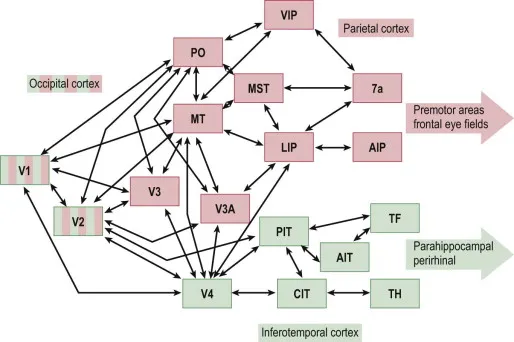

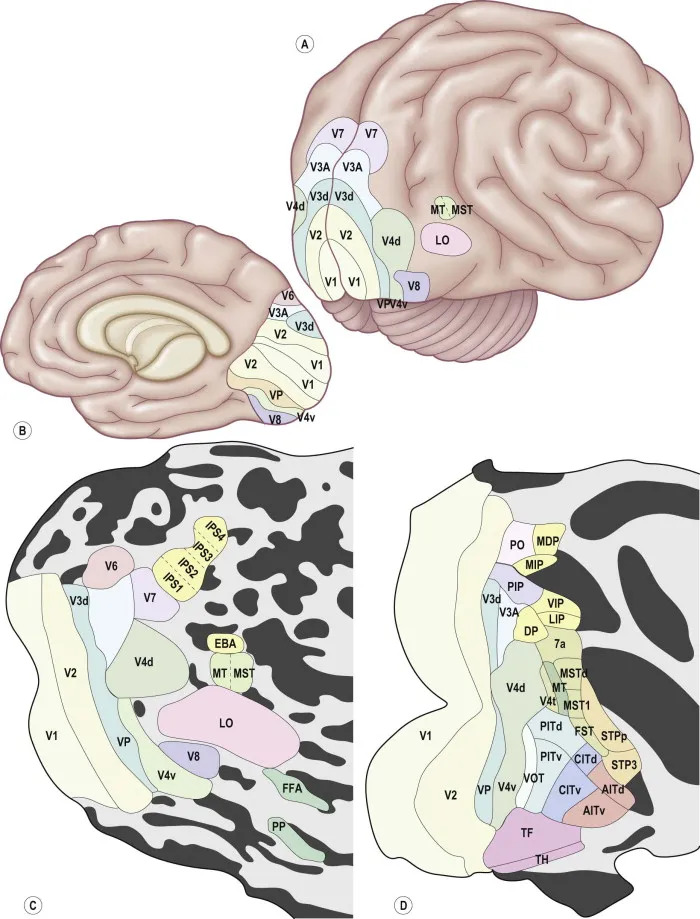

In [71]:
display(Image(filename='vis sys.jpg'))
display(Image(filename='v1_v6.jpg'))

In [72]:
# FEED FORWARD EXHIBITORY

#V1 -> V2
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.02}
syn_spec={'weight': 3.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V1_iaf_cond_alpha, V2_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V1_hh_psc_alpha, V2_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V1_hh_psc_alpha, V2_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)

#V1 -> V3
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.01}
syn_spec={'weight': 2.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V1_aeif_cond_alpha, V3_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V1_hh_psc_alpha, V3_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V1_aeif_cond_alpha, V3_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)


#V2 -> V3
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.02}
syn_spec={'weight': 3.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V2_aeif_cond_alpha, V3_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_hh_psc_alpha, V3_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_iaf_cond_exp, V3_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V2 -> V4
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.01}
syn_spec={'weight': 2.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V2_aeif_cond_alpha, V4_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_hh_psc_alpha, V4_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_iaf_cond_exp, V4_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V3 -> V4
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.02}
syn_spec={'weight': 3.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V3_aeif_cond_alpha, V4_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_hh_psc_alpha, V4_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_iaf_cond_exp, V4_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V3 -> V5
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.01}
syn_spec={'weight': 2.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V3_aeif_cond_alpha, V5_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_hh_psc_alpha, V5_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_iaf_cond_exp, V5_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V4 -> V5
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.02}
syn_spec={'weight': 3.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V4_aeif_cond_alpha, V5_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_hh_psc_alpha, V5_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_iaf_cond_exp, V5_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V4 -> V6
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.01}
syn_spec={'weight': 2.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V4_aeif_cond_alpha, V6_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_hh_psc_alpha, V6_iaf_psc_delta, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_iaf_cond_exp, V6_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V5 -> V6
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.02}
syn_spec={'weight': 3.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V5_aeif_cond_alpha, V6_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V5_hh_psc_alpha, V6_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V5_izhikevich, V6_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)




In [73]:
# FEEDBACK EXHIBITORY


#V2 -> V1
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.015}
syn_spec={'weight': 2.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V2_aeif_cond_alpha, V1_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_hh_psc_alpha, V1_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V2_iaf_cond_exp, V1_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)


#V3 -> V2
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.015}
syn_spec={'weight': 2.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V3_aeif_cond_alpha, V2_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_hh_psc_alpha, V2_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_iaf_cond_exp, V2_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V4 -> V3
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.015}
syn_spec={'weight': 2.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V4_aeif_cond_alpha, V3_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_hh_psc_alpha, V3_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_iaf_cond_exp, V3_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V5 -> V4
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.015}
syn_spec={'weight': 2.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V5_aeif_cond_alpha, V4_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V5_hh_psc_alpha, V4_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V5_izhikevich, V4_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V6 -> V5
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.015}
syn_spec={'weight': 2.0, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V6_iaf_cond_alpha, V5_iaf_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V6_hh_psc_alpha, V5_hh_psc_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V6_iaf_psc_delta, V5_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V3 -> V1
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.005}
syn_spec={'weight': 1.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V3_aeif_cond_alpha, V1_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V3_hh_psc_alpha, V1_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)

#V4 -> V2
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.005}
syn_spec={'weight': 1.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V4_aeif_cond_alpha, V2_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)
nest.Connect(V4_hh_psc_alpha, V2_iaf_cond_exp, syn_spec=syn_spec,conn_spec=conn_spec)

#V5 -> V3
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.005}
syn_spec={'weight': 1.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V5_aeif_cond_alpha, V3_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

#V6 -> V4
conn_spec={'rule': 'pairwise_bernoulli', 'p': 0.005}
syn_spec={'weight': 1.5, 'delay': 1.5, 'synapse_model': 'static_synapse'}
nest.Connect(V6_aeif_cond_alpha, V4_aeif_cond_alpha, syn_spec=syn_spec,conn_spec=conn_spec)

In [74]:
# Create Strong Connections between the clusters themselfes
conn_spec_ex={'rule': 'pairwise_bernoulli', 'p': 0.05}
syn_spec_ex={'weight': 1.1, 'delay': 1.0, 'synapse_model': 'static_synapse'}
conn_spec_inh={'rule': 'pairwise_bernoulli', 'p': 0.01}
syn_spec_inh={'weight': -0.9, 'delay': 1.0, 'synapse_model': 'static_synapse'}


# V1 neurotype-reflexive connections
nest.Connect(V1_iaf_cond_alpha,V1_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_iaf_cond_alpha,V1_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V1_aeif_cond_alpha,V1_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_aeif_cond_alpha,V1_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V1_iaf_cond_exp,V1_iaf_cond_exp, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_iaf_cond_exp,V1_iaf_cond_exp, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V1_hh_psc_alpha,V1_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_hh_psc_alpha,V1_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V1_iaf_cond_alpha,V1_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_iaf_cond_alpha,V1_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V1_iaf_cond_beta_gap,V1_iaf_cond_beta_gap, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V1_iaf_cond_beta_gap,V1_iaf_cond_beta_gap, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)



# V2 neurotype-reflexive connections

nest.Connect(V2_aeif_cond_alpha,V2_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V2_aeif_cond_alpha,V2_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V2_iaf_cond_exp,V2_iaf_cond_exp, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V2_iaf_cond_exp,V2_iaf_cond_exp, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V2_aeif_cond_alpha,V2_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V2_aeif_cond_alpha,V2_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V2_hh_psc_alpha,V2_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V2_hh_psc_alpha,V2_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V2_iaf_cond_alpha,V2_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V2_iaf_cond_alpha,V2_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

# V3 neurotype-reflexive connections

nest.Connect(V3_aeif_cond_alpha,V3_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V3_aeif_cond_alpha,V3_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V3_iaf_cond_exp,V3_iaf_cond_exp, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V3_iaf_cond_exp,V3_iaf_cond_exp, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V3_aeif_cond_alpha,V3_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V3_aeif_cond_alpha,V3_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V3_hh_psc_alpha,V3_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V3_hh_psc_alpha,V3_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V3_iaf_cond_alpha,V3_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V3_iaf_cond_alpha,V3_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

# V4 neurotype-reflexive connections
    
nest.Connect(V4_aeif_cond_alpha,V4_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_aeif_cond_alpha,V4_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V4_iaf_cond_exp,V4_iaf_cond_exp, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_iaf_cond_exp,V4_iaf_cond_exp, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V4_hh_psc_alpha,V4_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_hh_psc_alpha,V4_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V4_gif_cond_exp,V4_gif_cond_exp, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_gif_cond_exp,V4_gif_cond_exp, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V4_iaf_cond_alpha,V4_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_iaf_cond_alpha,V4_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V4_iaf_cond_beta_gap,V4_iaf_cond_beta_gap, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V4_iaf_cond_beta_gap,V4_iaf_cond_beta_gap, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

# V5 neurotype-reflexive connections
 
nest.Connect(V5_iaf_cond_alpha,V5_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V5_iaf_cond_alpha,V5_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V5_aeif_cond_alpha,V5_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V5_aeif_cond_alpha,V5_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V5_hh_psc_alpha,V5_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V5_hh_psc_alpha,V5_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V5_izhikevich,V5_izhikevich, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V5_izhikevich,V5_izhikevich, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V5_iaf_cond_beta_gap,V5_iaf_cond_beta_gap, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V5_iaf_cond_beta_gap,V5_iaf_cond_beta_gap, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

# V6 neurotype-reflexive connections
 
nest.Connect(V6_iaf_cond_alpha,V6_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_iaf_cond_alpha,V6_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V6_aeif_cond_alpha,V6_aeif_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_aeif_cond_alpha,V6_aeif_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V6_hh_psc_alpha,V6_hh_psc_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_hh_psc_alpha,V6_hh_psc_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V6_iaf_psc_delta,V6_iaf_psc_delta, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_iaf_psc_delta,V6_iaf_psc_delta, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V6_iaf_cond_alpha,V6_iaf_cond_alpha, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_iaf_cond_alpha,V6_iaf_cond_alpha, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

nest.Connect(V6_iaf_cond_beta_gap,V6_iaf_cond_beta_gap, syn_spec=syn_spec_ex,conn_spec=conn_spec_ex)
nest.Connect(V6_iaf_cond_beta_gap,V6_iaf_cond_beta_gap, syn_spec=syn_spec_inh,conn_spec=conn_spec_inh)

In [75]:
def get_model_from_var_name(var_name):
    if not isinstance(var_name, str):
        raise ValueError("var_name muss ein String sein für get_model_from_var_name")

    parts = var_name.split('_', 1)
    if len(parts) > 1:
        model_part = parts[1]
        if model_part.startswith("iaf_cond_beta_gap"): return "iaf_cond_beta_gap"
        if model_part.startswith("iaf_cond_alpha"): return "iaf_cond_alpha"
        if model_part.startswith("aeif_cond_alpha"): return "aeif_cond_alpha"
        if model_part.startswith("iaf_cond_exp"): return "iaf_cond_exp"
        if model_part.startswith("hh_psc_alpha"): return "hh_psc_alpha"
        if model_part.startswith("izhikevich"): return "izhikevich"
        if model_part.startswith("iaf_psc_delta"): return "iaf_psc_delta"
        if model_part.startswith("gif_cond_exp"): return "gif_cond_exp"
        return model_part
    return None


connection_rules_data = [
    ("iaf_cond_alpha", "iaf_cond_alpha", 0.10, 1.5, 1.0, "+"),
    ("aeif_cond_alpha", "iaf_cond_alpha", 0.08, 1.5, 1.2, "+"),
    ("aeif_cond_alpha", "aeif_cond_alpha", 0.07, 1.7, 1.2, "+"),
    ("hh_psc_alpha", "iaf_cond_alpha", 0.03, 2.0, 1.5, "+"),
    ("hh_psc_alpha", "aeif_cond_alpha", 0.03, 2.0, 1.5, "+"),
    ("hh_psc_alpha", "iaf_cond_exp", 0.03, 2.0, 1.5, "+"),
    ("hh_psc_alpha", "hh_psc_alpha", 0.03, 2.0, 1.5, "+"), 
    ("iaf_cond_exp", "iaf_cond_alpha", 0.05, 1.2, 1.0, "+"),
    ("iaf_cond_exp", "aeif_cond_alpha", 0.04, 1.3, 1.0, "+"),
    ("iaf_cond_alpha", "iaf_cond_beta_gap", 0.12, 1.0, 1.2, "+"),
    ("aeif_cond_alpha", "iaf_cond_beta_gap", 0.10, 1.2, 1.3, "+"),
    ("hh_psc_alpha", "iaf_cond_beta_gap", 0.06, 1.5, 1.5, "+"),
    ("iaf_cond_beta_gap", "iaf_cond_alpha", 0.20, 1.0, 5.0, "–"),
    ("iaf_cond_beta_gap", "aeif_cond_alpha", 0.20, 1.0, 5.0, "–"),
    ("iaf_cond_beta_gap", "hh_psc_alpha", 0.10, 1.2, 5.0, "–"),
    ("iaf_cond_beta_gap", "iaf_cond_beta_gap", 0.15, 1.0, 4.0, "–"),
    ("izhikevich", "iaf_cond_alpha", 0.05, 2.0, 1.3, "+"),
    ("izhikevich", "aeif_cond_alpha", 0.05, 2.0, 1.2, "+"),
    ("izhikevich", "iaf_cond_beta_gap", 0.03, 2.2, 1.0, "+"),
    ("iaf_psc_delta", "iaf_cond_alpha", 0.04, 0.5, 2.0, "+"),
    ("iaf_psc_delta", "aeif_cond_alpha", 0.03, 0.5, 1.8, "+"),
    ("iaf_psc_delta", "iaf_cond_beta_gap", 0.02, 0.5, 1.5, "+"),
    ("gif_cond_exp", "iaf_cond_alpha", 0.02, 2.5, 1.5, "+"),
    ("gif_cond_exp", "iaf_cond_beta_gap", 0.02, 2.5, 1.2, "+"),
]


parsed_rules = []
for r_src_model, r_tgt_model, r_p, r_delay, r_weight, r_sign in connection_rules_data:
    weight_val = r_weight if r_sign == "+" else -r_weight
    parsed_rules.append({
        "source_model": r_src_model,
        "target_model": r_tgt_model,
        "p": r_p,
        "delay": r_delay,
        "weight": weight_val,
        "synapse_model": "static_synapse"
    })



populations_in_region = {
    "V1": ["V1_aeif_cond_alpha", "V1_iaf_cond_exp", "V1_hh_psc_alpha", "V1_iaf_cond_alpha", "V1_iaf_cond_beta_gap"],
    "V2": ["V2_iaf_cond_exp", "V2_aeif_cond_alpha", "V2_hh_psc_alpha", "V2_iaf_cond_alpha"],
    "V3": ["V3_iaf_cond_exp", "V3_aeif_cond_alpha", "V3_hh_psc_alpha", "V3_iaf_cond_alpha"], 
    "V4": ["V4_aeif_cond_alpha", "V4_iaf_cond_exp", "V4_hh_psc_alpha", "V4_gif_cond_exp", "V4_iaf_cond_alpha", "V4_iaf_cond_beta_gap"],
    "V5": ["V5_iaf_cond_alpha", "V5_aeif_cond_alpha", "V5_hh_psc_alpha", "V5_izhikevich", "V5_iaf_cond_beta_gap"],
    "V6": ["V6_aeif_cond_alpha", "V6_hh_psc_alpha", "V6_iaf_psc_delta", "V6_iaf_cond_alpha", "V6_iaf_cond_beta_gap"]
}

user_v2_connections = {
    ("V2_aeif_cond_alpha", "V2_hh_psc_alpha"),
    ("V2_aeif_cond_alpha", "V2_aeif_cond_alpha"),
}


for region_label in ["V1","V2","V3", "V4", "V5", "V6"]:
    current_region_vars = populations_in_region[region_label]
    made_connections_in_region = set()
    for rule in parsed_rules:
        for source_var_str in current_region_vars:
            actual_source_model = get_model_from_var_name(source_var_str)
            if actual_source_model == rule["source_model"]:
                for target_var_str in current_region_vars:
                    actual_target_model = get_model_from_var_name(target_var_str)
                    if actual_target_model == rule["target_model"]:
                        if (source_var_str, target_var_str) in made_connections_in_region:
                            continue
                        conn_spec = {'rule': 'pairwise_bernoulli', 'p': rule["p"]}
                        syn_spec = {'weight': rule["weight"], 'delay': rule["delay"], 'synapse_model': rule["synapse_model"]}
                        spec_suffix = "ex" if rule["weight"] > 0 else "inh"
                        made_connections_in_region.add((source_var_str, target_var_str))


# Create the input layer for optical radiations - the Line of Gennari
### The Cones should pierce that section.
#### -> the cones are already created above and just need to be turned into neurons with the function connect_cone() 
#### -> connect grid to optical radiation

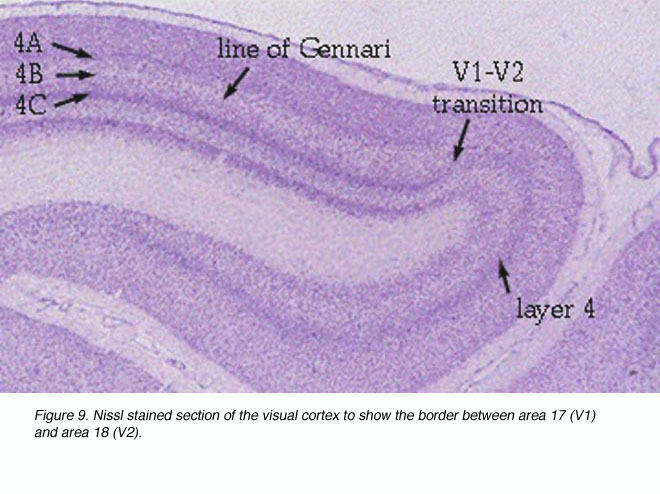

In [76]:
display(Image(filename='line.jpg'))

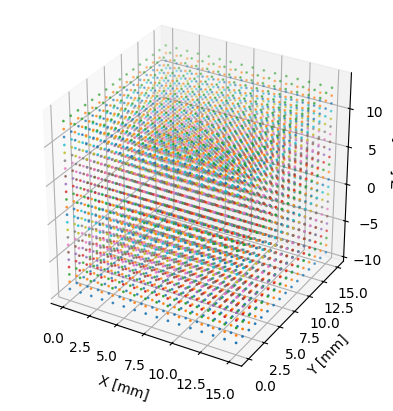

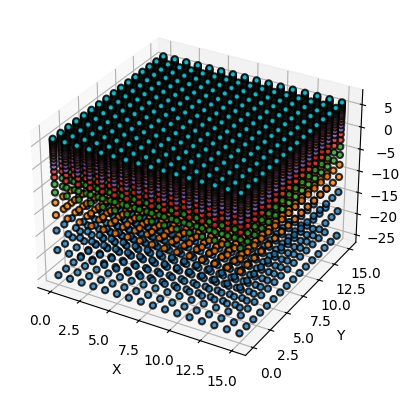

In [77]:
gls=16
m=np.array((0,0,-9))# mitten durch V1
grid_size_list = [gls] * 23
grid = create_Grid_z(m=m, grid_size_list=grid_size_list, plot=True,rot_phi=0)


F =  [

        lambda x, y, z: np.zeros_like(z),

        lambda x, y, z: np.zeros_like(z),

        lambda x, y, z: -z**2 + 0.5

     ]


dt = 0.01

for idx, sub_grid in enumerate(grid):
    grid[idx] = simulate_vector_field_flow(

        initial_positions=sub_grid,

        dt=dt,

        f1=F[0], 

        f2=F[1],

        f3=F[2],

        num_steps=8,

        plot=False,

        scatter_size=1.0

    )
len(grid)
type(grid[0])
plot_point_clusters(grid)

# Next Steps:

### ^ turn that monster into a SNN for later connections with the LGN and the cols
### (medium) -> Model the LGN

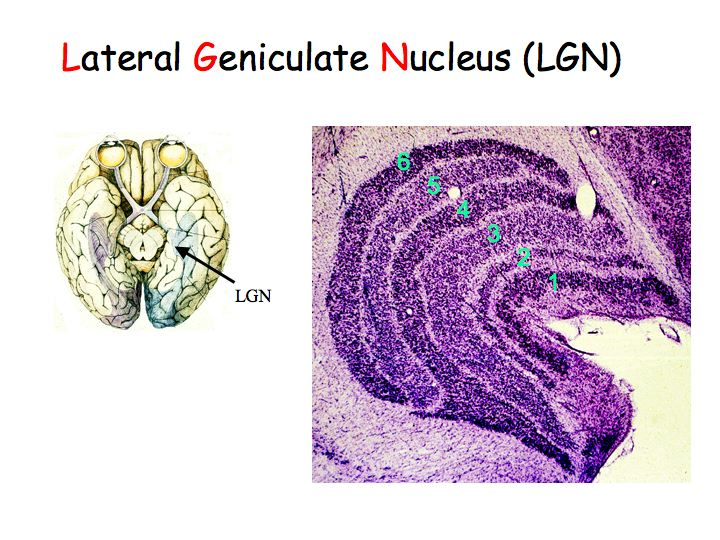

In [78]:
display(Image(filename='LGN.jpg'))

### -> Model parallel pathways and optic chiasm -> need to shuffle arrays and somehow combine signal.


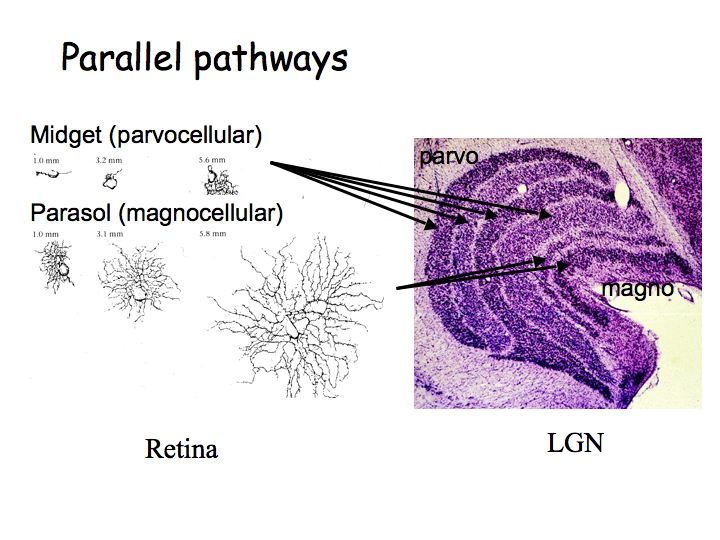

In [79]:
display(Image(filename='parallel path.jpg'))

### ->(hard)Connecting the optic radiation to the cols and the cols to the neuron populations
